<a href="https://colab.research.google.com/github/JoDeMiro/Micado-Research/blob/main/MiCADO2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Micado Auto Scale Research

Ebben a felskálázási adatok elemzésével foglalkozom.

Ez az interkatív bemutató arra van, hogy a válotzók közötti összefüggéseket jobban átlásssam, elemezzem, az esetleges anomáliákat rögtön kiszúrjam.

A playground részben a rendszer alapját adó neuráli háló beállításaival lehet játszani és megfigyelni, hogy milyen hatással van a rendszer teljesítményére.

<a name="tartalom"></a>

## Tartalom

Bevezetés

> [Emptyl](#empty)<br>
> [Play Ground](#play_ground)<br>
> [SandBox](#sandbox)<br>
> [Before After](#beforeafter)<br>
> [Szintetikus adatok generálása](#szintetikus_adatok)<br>
> [Irodalom](#irodalom)<br>
> [ToDo](#todo)<br>


In [ ]:
%%capture
!pip install plotly
!pip install chart-studio
!pip install pyit2fls

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import chart_studio.plotly as py
import plotly.graph_objects as go

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

from sklearn import preprocessing

from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from plotly.offline import iplot
from mpl_toolkits.mplot3d import Axes3D

from ipywidgets import IntSlider
from ipywidgets import HTML
from ipywidgets import interact, interactive, fixed, interact_manual

import pickle
import warnings
warnings.filterwarnings('ignore')


In [ ]:
#@title
from matplotlib import pyplot
from math import cos, sin, atan
from palettable.tableau import Tableau_10
from time import localtime, strftime
import numpy as np

class Neuron():
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def draw(self, neuron_radius, id=-1, name=None):
        circle = pyplot.Circle((self.x, self.y), radius=neuron_radius, fill=False)
        pyplot.gca().add_patch(circle)
        pyplot.gca().text(self.x, self.y-0.15, str(id), size=10, ha='center')
        if name is not None:
          pyplot.gca().text(self.x+0.05, self.y-0.5, str(name), size=20, ha='center', va='top', rotation='vertical')

class Layer():
    def __init__(self, network, number_of_neurons, number_of_neurons_in_widest_layer, input_names=None):
        self.vertical_distance_between_layers = 6
        self.horizontal_distance_between_neurons = 2
        self.neuron_radius = 0.5
        self.number_of_neurons_in_widest_layer = number_of_neurons_in_widest_layer
        self.previous_layer = self.__get_previous_layer(network)
        self.y = self.__calculate_layer_y_position()
        self.neurons = self.__intialise_neurons(number_of_neurons)
        self.input_names = input_names

    def __intialise_neurons(self, number_of_neurons):
        neurons = []
        x = self.__calculate_left_margin_so_layer_is_centered(number_of_neurons)
        for iteration in range(number_of_neurons):
            neuron = Neuron(x, self.y)
            neurons.append(neuron)
            x += self.horizontal_distance_between_neurons
        return neurons

    def __calculate_left_margin_so_layer_is_centered(self, number_of_neurons):
        return self.horizontal_distance_between_neurons * (self.number_of_neurons_in_widest_layer - number_of_neurons) / 2

    def __calculate_layer_y_position(self):
        if self.previous_layer:
            return self.previous_layer.y + self.vertical_distance_between_layers
        else:
            return 0

    def __get_previous_layer(self, network):
        if len(network.layers) > 0:
            return network.layers[-1]
        else:
            return None

    def __line_between_two_neurons(self, neuron1, neuron2, weight=0.4, textoverlaphandler=None):
        angle = atan((neuron2.x - neuron1.x) / float(neuron2.y - neuron1.y))
        x_adjustment = self.neuron_radius * sin(angle)
        y_adjustment = self.neuron_radius * cos(angle)

        # assign colors to lines depending on the sign of the weight
        color=Tableau_10.mpl_colors[0]
        if weight > 0: color=Tableau_10.mpl_colors[1]

        # assign different linewidths to lines depending on the size of the weight
        abs_weight = abs(weight)        
        if abs_weight > 0.5: 
            linewidth = 5*abs_weight
        elif abs_weight > 0.8: 
            linewidth =  50*abs_weight
        else:
            linewidth = abs_weight

        # draw the weights and adjust the labels of weights to avoid overlapping
        if abs_weight > 0.5: 
            # while loop to determine the optimal locaton for text lables to avoid overlapping
            index_step = 2
            num_segments = 10   
            txt_x_pos = neuron1.x - x_adjustment+index_step*(neuron2.x-neuron1.x+2*x_adjustment)/num_segments
            txt_y_pos = neuron1.y - y_adjustment+index_step*(neuron2.y-neuron1.y+2*y_adjustment)/num_segments
            while ((not textoverlaphandler.getspace([txt_x_pos-0.5, txt_y_pos-0.5, txt_x_pos+0.5, txt_y_pos+0.5])) and index_step < num_segments):
                index_step = index_step + 1
                txt_x_pos = neuron1.x - x_adjustment+index_step*(neuron2.x-neuron1.x+2*x_adjustment)/num_segments
                txt_y_pos = neuron1.y - y_adjustment+index_step*(neuron2.y-neuron1.y+2*y_adjustment)/num_segments

            # print("Label positions: ", "{:.2f}".format(txt_x_pos), "{:.2f}".format(txt_y_pos), "{:3.2f}".format(weight))
            a=pyplot.gca().text(txt_x_pos, txt_y_pos, "{:3.2f}".format(weight), size=12, ha='center')
            a.set_bbox(dict(facecolor='white', alpha=0))
            # print(a.get_bbox_patch().get_height())

        line = pyplot.Line2D((neuron1.x - x_adjustment, neuron2.x + x_adjustment), (neuron1.y - y_adjustment, neuron2.y + y_adjustment), linewidth=linewidth, color=color)
        pyplot.gca().add_line(line)

    def draw(self, layerType=0, weights=None, textoverlaphandler=None):
        j=0 # index for neurons in this layer
        z=0 # counter for names
        for neuron in self.neurons:            
            i=0 # index for neurons in previous layer
            if(layerType==0):
              name = self.input_names[z]
              neuron.draw( self.neuron_radius, id=j+1, name=name)
            else:
              neuron.draw( self.neuron_radius, id=j+1)
            if self.previous_layer:
                for previous_layer_neuron in self.previous_layer.neurons:
                    self.__line_between_two_neurons(neuron, previous_layer_neuron, weights[i,j], textoverlaphandler)
                    i=i+1
            j=j+1
            z=z+1
        
        # write Text
        x_text = self.number_of_neurons_in_widest_layer * self.horizontal_distance_between_neurons
        if layerType == 0:
            pyplot.text(x_text, self.y, 'Input Layer', fontsize = 12)
        elif layerType == -1:
            pyplot.text(x_text, self.y, 'Output Layer', fontsize = 12)
        else:
            pyplot.text(x_text, self.y, 'Hidden Layer '+str(layerType), fontsize = 12)

# A class to handle Text Overlapping
# The idea is to first create a grid space, if a grid is already occupied, then
# the grid is not available for text labels.
class TextOverlappingHandler():
    # initialize the class with the width and height of the plot area
    def __init__(self, width, height, grid_size=0.2):
        self.grid_size = grid_size
        self.cells = np.ones((int(np.ceil(width / grid_size)), int(np.ceil(height / grid_size))), dtype=bool)

    # input test_coordinates(bottom left and top right), 
    # getspace will tell you whether a text label can be put in the test coordinates
    def getspace(self, test_coordinates):
        x_left_pos = int(np.floor(test_coordinates[0]/self.grid_size))
        y_botttom_pos = int(np.floor(test_coordinates[1]/self.grid_size))
        x_right_pos = int(np.floor(test_coordinates[2]/self.grid_size))
        y_top_pos = int(np.floor(test_coordinates[3]/self.grid_size))
        if self.cells[x_left_pos, y_botttom_pos] and self.cells[x_left_pos, y_top_pos] \
        and self.cells[x_right_pos, y_top_pos] and self.cells[x_right_pos, y_botttom_pos]:
            for i in range(x_left_pos, x_right_pos):
                for j in range(y_botttom_pos, y_top_pos):
                    self.cells[i, j] = False

            return True
        else:
            return False

class NeuralNetwork():
    def __init__(self, number_of_neurons_in_widest_layer, input_names=None):
        self.number_of_neurons_in_widest_layer = number_of_neurons_in_widest_layer
        self.layers = []
        self.layertype = 0
        self.input_names = []
        if (input_names == None):
            self.input_names = []
        else:
            self.input_names = input_names

    def add_layer(self, number_of_neurons ):
        layer = Layer(self, number_of_neurons, self.number_of_neurons_in_widest_layer, self.input_names)
        self.layers.append(layer)

    def draw(self, weights_list=None, input_names=None):
        # vertical_distance_between_layers and horizontal_distance_between_neurons are the same with the variables of the same name in layer class
        vertical_distance_between_layers = 6
        horizontal_distance_between_neurons = 2
        overlaphandler = TextOverlappingHandler(\
            self.number_of_neurons_in_widest_layer*horizontal_distance_between_neurons,\
            len(self.layers)*vertical_distance_between_layers, grid_size=0.2 )

        if( len(self.input_names) <= 10 ):
          pyplot.figure(figsize=(12, 9))
        elif( len(self.input_names) > 10 ):
          pyplot.figure(figsize=(24, 10))
        else:
          pyplot.figure(figsize=(12,9))
        for i in range( len(self.layers) ):
            layer = self.layers[i]                                
            if i == 0:
                layer.draw( layerType=0 )
            elif i == len(self.layers)-1:
                layer.draw( layerType=-1, weights=weights_list[i-1], textoverlaphandler=overlaphandler)
            else:
                layer.draw( layerType=i, weights=weights_list[i-1], textoverlaphandler=overlaphandler)

        pyplot.axis('scaled')
        pyplot.axis('off')
        pyplot.title( 'Neural Network architecture', fontsize=15 )
        figureName='ANN_'+strftime("%Y%m%d_%H%M%S", localtime())+'.png'
        pyplot.savefig(figureName, dpi=300, bbox_inches="tight")
        pyplot.show()

class DrawNN():
    # para: neural_network is an array of the number of neurons 
    # from input layer to output layer, e.g., a neural network of 5 nerons in the input layer, 
    # 10 neurons in the hidden layer 1 and 1 neuron in the output layer is [5, 10, 1]
    # para: weights_list (optional) is the output weights list of a neural network which can be obtained via classifier.coefs_
    def __init__( self, neural_network, weights_list=None, input_names=None ):
        # self.input_names = input_names
        self.neural_network = neural_network
        self.weights_list = weights_list
        # if input_names exists
        if input_names is None:
          self.input_names = []
        else:
          self.input_names = input_names
        # if weights_list is none, then create a uniform list to fill the weights_list
        if weights_list is None:
            weights_list=[]
            for first, second in zip(neural_network, neural_network[1:]):
                tempArr = np.ones((first, second))*0.4
                weights_list.append(tempArr)
            self.weights_list = weights_list
        
    def draw( self ):
        widest_layer = max( self.neural_network )
        network = NeuralNetwork( widest_layer, self.input_names)
        for l in self.neural_network:
            network.add_layer(l)
        network.draw(self.weights_list)

In [ ]:
#@title

def crosscorr(datax, datay, lag=0):
    """ Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    """
    return datax.corr(datay.shift(lag))

def save_mlp(name):
  filename = name
  pickle.dump(mlp, open(filename, 'wb'))

def load_mlp(name):
  filename = name
  mlp = pickle.load(open(filename, 'rb'))
  return mlp

def timeline_plot(real, estimated):
  plt.figure(figsize=(20, 6))
  plt.plot(real, label = 'Real')
  plt.plot(estimated, label = 'Estimated')
  plt.title('Estimated vs Real values', fontsize=18)
  plt.ylabel('Average Latency - Normalized', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  a1.scatter(y_train, y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  a2.scatter(y_test, y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  sns.regplot(ax=a1, x = y_train, y = y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  a1.set_ylim(-0.05, 1.05)
  a1.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  sns.regplot(ax=a2, x = y_test, y = y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  a2.set_ylim(-0.05, 1.05)
  a2.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummulative_plots(errors, cummulative_errors, y_real, y_predicted):
  plt.figure(figsize=(20,4))
  plt.plot(errors, label='Error per estimation')
  plt.ylabel('Error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(cummulative_errors, label='Cummulative error')
  plt.ylabel('Cumulative error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(y_predicted, label='predicted')
  plt.plot(y_real, label='real')
  plt.ylabel('Average Latency', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def cummaulative_real_predicted_scatter(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  plt.scatter(y_real, y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummaulative_real_predicted_scatter_sns(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  sns.regplot(x = y_real, y = y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  plt.ylim(-0.05, 1.05)
  plt.xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def timeline(variable):
  plt.figure(figsize=(20,4))
  plt.plot(variable, label='Timeseries')
  plt.ylabel('Value', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()


In [ ]:
!wget https://github.com/JoDeMiro/Data/raw/main/Micado/nn_training_data_2777.csv

!wget https://github.com/JoDeMiro/Data/raw/main/Micado/nn_training_data_pk_hosszu_clean-roviditett.csv

!wget https://github.com/JoDeMiro/Data/raw/main/Micado/synthetic_df.csv

--2021-07-04 11:22:37--  https://github.com/JoDeMiro/Data/raw/main/Micado/nn_training_data_2777.csv
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JoDeMiro/Data/main/Micado/nn_training_data_2777.csv [following]
--2021-07-04 11:22:37--  https://raw.githubusercontent.com/JoDeMiro/Data/main/Micado/nn_training_data_2777.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 536472 (524K) [text/plain]
Saving to: ‘nn_training_data_2777.csv’

nn_training_data_27 100%[===================>] 523.90K  --.-KB/s    in 0.03s   

2021-07-04 11:22:38 (15.2 MB/s) - ‘nn_training_data_2777.csv’ saved [536472/536472]

In [ ]:
df = pd.read_csv('nn_training_data_2777.csv')

df = pd.read_csv('nn_training_data_pk_hosszu_clean-roviditett.csv')

df = pd.read_csv('synthetic_df.csv')

In [ ]:
df.head()

,timestamp,PktIn,KBIn,AVG_RR,Inter,CTXSW,KBOut,CPU,SUM_RR,PktOut,vm_number,AVG_LAT_05
0,0,108.139906,26.193229,3.249656,9.554430,15.553601,4.056635,1.911562,13.386896,36.014849,3,82.463145
1,1,110.008204,26.312156,3.596558,9.763793,17.213952,4.489682,2.115622,14.815951,35.809488,3,84.199721
2,2,111.791715,26.441571,3.943180,10.185578,18.872967,4.922381,2.319518,16.243856,35.594808,3,85.989481
3,3,113.496396,26.580951,4.289245,10.822717,20.529313,5.354383,2.523086,17.669463,35.371796,3,87.835079
4,4,115.127518,26.729728,4.634474,11.660831,22.181659,5.785342,2.726161,19.091628,35.141351,3,89.731962


In [ ]:
# gyors időbeli áttekintés

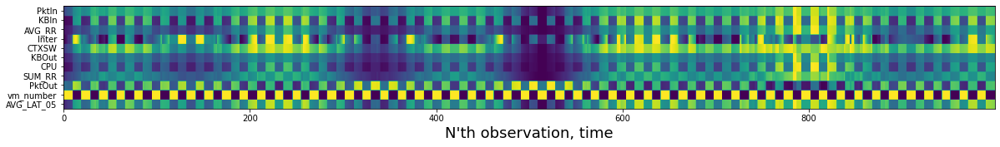

In [ ]:
X = df.values

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)

h = np.zeros((1, df.shape[0]))

for i, v in enumerate(df.columns):
  if( v != 'timestamp'):
    col = X_scaled[:,i]
    size = col.size
    col = col.reshape((1, col.size))
    col = col.T
    col = col.repeat(10, axis=0)
    col = col.reshape((size, 10))
    h = np.concatenate((h, col.T), axis=0)

# print(df.columns)
print('')
labels = df.columns[1:]
y = np.arange(5, 115, 10)
plt.figure(figsize=(20, 7)); plt.imshow(h); plt.yticks(y, labels, rotation='horizontal'); plt.xlabel('N\'th observation, time', fontsize=18); plt.show()

In [ ]:
# gyors testzek a változókra

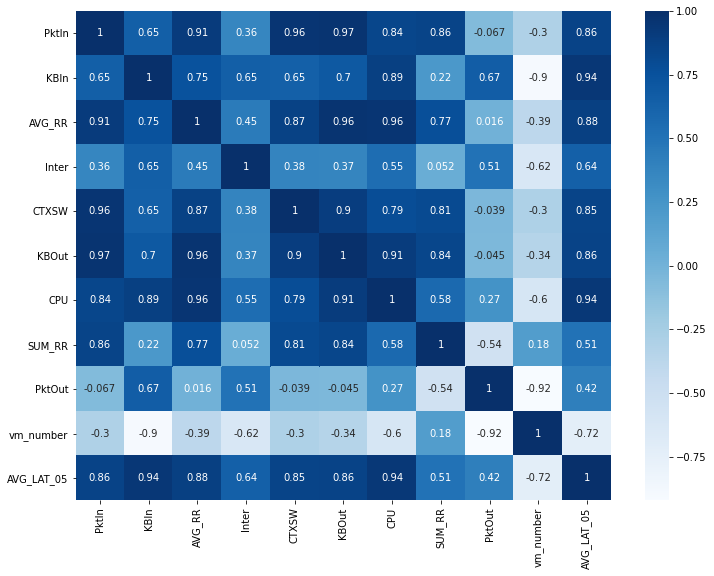

In [ ]:
# korrelácó az egyes változók között
corr = df.iloc[: , 1:].corr()

plt.figure(figsize=(12,9))
sns.heatmap(corr, cmap="Blues", annot=True)
# plt.savefig('correlation_matrix.png')
plt.show()


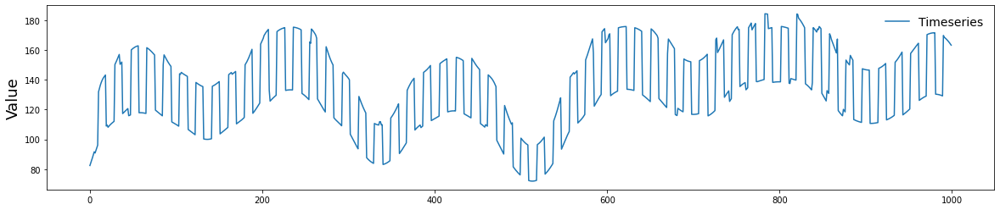

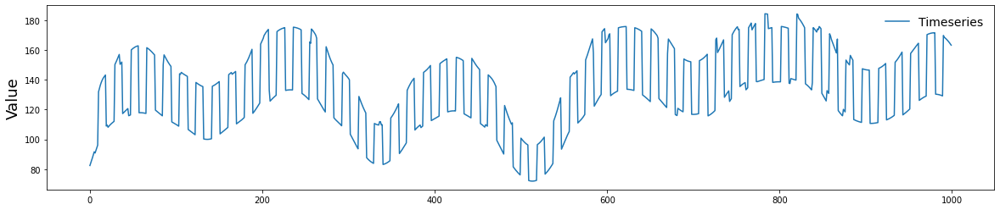

In [ ]:
timeline(df['AVG_LAT_05'])

df = df[df['AVG_LAT_05'] < 20000]

timeline(df['AVG_LAT_05'])


In [ ]:
# Keressük meg azokat az adatokat ahol változott a gépek száma

In [ ]:
def createBeforeafterDF(df, lag, inputMetrics):
    beforeafterDF = df.copy()
    length = len(inputMetrics)
    # print(length)
    inputVariables = np.flip(beforeafterDF.columns[0:length].ravel(), axis=-1)
    # print('Input Variablels : ', inputVariables)

    index = length
    for i in inputVariables:
        new_column = beforeafterDF[i].shift(lag)
        new_column_name = (i + str(1)) # Todo: rename str(lag)
        beforeafterDF.insert(loc=index, column=new_column_name, value=new_column)

    beforeafterDF = beforeafterDF[lag:]

    return beforeafterDF

# Fontos
metrics = df.columns

# Before After adatok egy sorban
ba = createBeforeafterDF(df, 1, metrics)

# Csak azok az adatok ahol tényleges eltérés volt a gépek száma között
def createScalingDF(theBeforeAfterDF):
  new_beforeafterDF = theBeforeAfterDF.copy()
  scalingDF = new_beforeafterDF[new_beforeafterDF.vm_number != new_beforeafterDF.vm_number1]
  return scalingDF

fd = createScalingDF(ba)

rossz = fd.copy()

# Ki kell szűrni azokat az eseteket, ahol egynél több gépet adott hozzá, vagy vett el
fd['difference'] = fd['vm_number']-fd['vm_number1']
fd['abs_difference'] = abs(fd['difference'])
fd = fd[fd['abs_difference'] < 2]

print(fd.shape)

(105, 26)


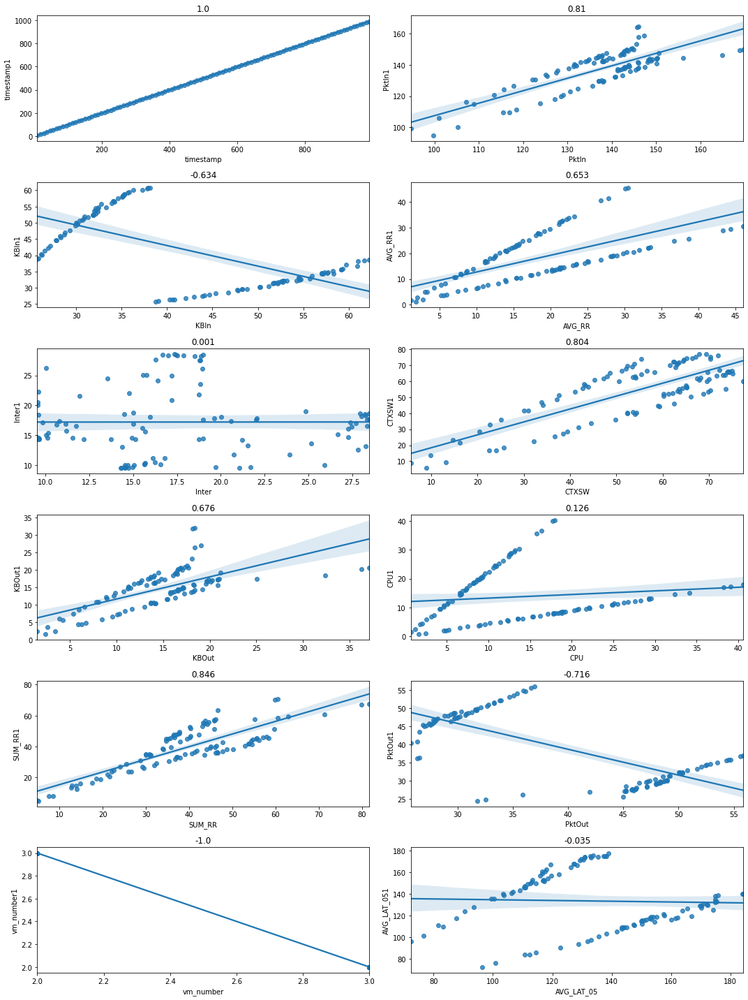

In [ ]:
# Most nézzük meg, hogy milyen korreláció van az egyes before after változók között

fig, axes = plt.subplots(6, 2, figsize=(15, 20), sharey=False)
for j, i in enumerate(df.columns):
  corr = str(round(fd[i].corr(fd[i+'1']), 3))

  r = int(j/2)
  c = 1 if (j % 2 == 1) else 0
  sns.regplot(ax=axes[r, c], x = fd[i], y = fd[i+'1']).set_title(corr)

plt.tight_layout()
plt.show()


r2  =  0.015842733316079993
r2w =  0.015842733316079993


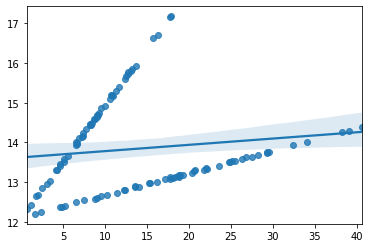

In [ ]:
# Regresszió

y = fd['CPU'].values          # Current
x = fd['CPU1'].values         # Lag
x = x.reshape(-1,1)

regression = LinearRegression()

regression.fit(x,y)

y_pred = regression.predict(x)

r2  = r2_score(y, y_pred)
r2w = r2_score(y, y_pred, multioutput='variance_weighted')

print('r2  = ', r2)
print('r2w = ', r2w)

sns.regplot(y, y_pred)
plt.show()

r2  =  0.7086003213852908
r2w =  0.7086003213852908


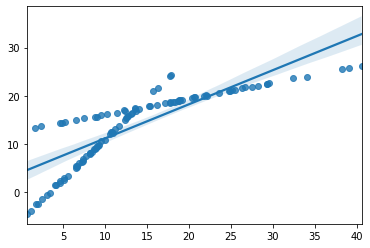

In [ ]:
# Regresszió

y = fd['CPU'].values                    # Current
x = fd[['CPU1', 'vm_number']].values    # Lag, vm_number

regression = LinearRegression()

regression.fit(x,y)

y_pred = regression.predict(x)

r2  = r2_score(y, y_pred)
r2w = r2_score(y, y_pred, multioutput='variance_weighted')

print('r2  = ', r2)
print('r2w = ', r2w)

sns.regplot(y, y_pred)
plt.show()

r2  =  0.7086003213852909
r2w =  0.7086003213852909


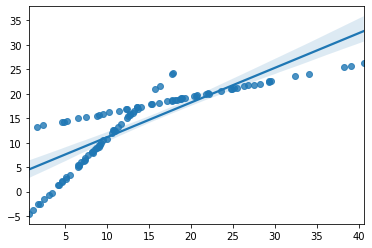

In [ ]:
# Regresszió

y = fd['CPU'].values                    # Current
x = fd[['CPU1', 'difference']].values   # Lag, difference

regression = LinearRegression()

regression.fit(x,y)

y_pred = regression.predict(x)

r2  = r2_score(y, y_pred)
r2w = r2_score(y, y_pred, multioutput='variance_weighted')

print('r2  = ', r2)
print('r2w = ', r2w)

sns.regplot(y, y_pred)
plt.show()

r2  =  0.7086003213852908
r2w =  0.7086003213852908


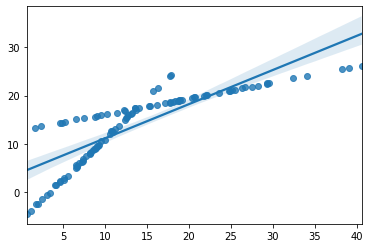

In [ ]:
# Regresszió

y = fd['CPU'].values                    # Current
x = fd[['CPU1', 'vm_number', 'difference']].values   # Lag, vm_number, difference

regression = LinearRegression()

regression.fit(x,y)

y_pred = regression.predict(x)

r2  = r2_score(y, y_pred)
r2w = r2_score(y, y_pred, multioutput='variance_weighted')

print('r2  = ', r2)
print('r2w = ', r2w)

sns.regplot(y, y_pred)
plt.show()

In [ ]:
fd.head()

,timestamp,PktIn,KBIn,AVG_RR,Inter,CTXSW,KBOut,CPU,SUM_RR,PktOut,vm_number,AVG_LAT_05,timestamp1,PktIn1,KBIn1,AVG_RR1,Inter1,CTXSW1,KBOut1,CPU1,SUM_RR1,PktOut1,vm_number1,AVG_LAT_051,difference,abs_difference
10,10,128.456694,43.882805,10.009310,26.689412,38.535115,10.050592,8.831744,22.111303,52.579168,2,131.932802,9.0,119.821724,27.414149,6.338428,15.135517,27.330786,7.128319,3.728487,23.523452,34.378100,3.0,96.138358,-1.0,1.0
19,19,130.187871,29.301451,9.528801,17.209721,41.087416,10.716274,5.605177,35.363706,32.077097,3,108.959315,18.0,137.565078,47.641018,13.842248,20.849775,53.291647,13.899339,12.213748,30.578546,50.184362,2.0,143.220177,1.0,1.0
29,29,142.344165,51.148702,18.340877,14.358326,62.487648,16.297807,16.183127,35.855176,48.551977,2,150.268599,28.0,133.410850,30.517038,11.985587,13.064803,46.143639,12.035021,7.050345,39.715568,31.156640,3.0,112.105969,-1.0,1.0
38,38,138.053686,31.917998,14.073569,9.636050,54.182216,14.131614,8.278570,46.634326,29.627581,3,117.321266,37.0,142.256517,52.293396,20.848795,14.328984,62.308915,16.251191,18.395996,35.752620,48.584560,2.0,151.917245,1.0,1.0
48,48,145.355912,54.256666,23.045290,19.704167,68.873382,17.963312,20.334079,39.519286,47.367715,2,160.082479,47.0,136.864321,32.118099,15.272383,9.617310,52.033243,13.571126,8.983755,44.784717,30.043623,3.0,116.412665,-1.0,1.0


r2_old  =  0.7086003213852908 	 r2w_old =  0.7086003213852908
r2_new  =  0.49229486234490005 	 r2w_new =  0.4922948623449001


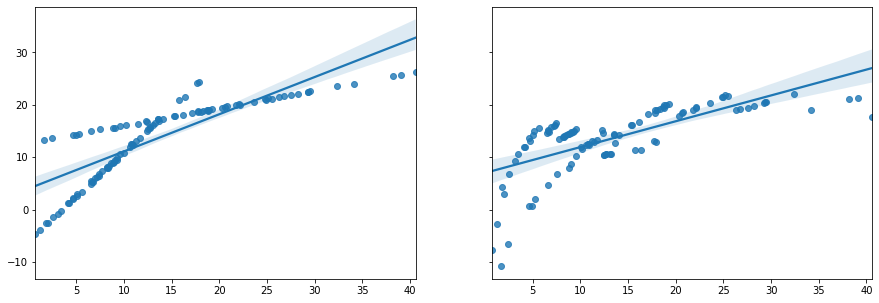

In [ ]:
# Regresszió

# A 'vm_number' változót is figyelembe vesszük

y     = fd['CPU'].values          # Current
x_old = fd[['CPU1', 'vm_number1', 'difference']].values
x_new = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051']].values

x_new = fd[['CPU1', 'PktIn1']].values

regression = LinearRegression()

# fit old
regression.fit(x_old, y)
y_pred_old = regression.predict(x_old)
r2_old  = r2_score(y, y_pred_old)
r2w_old = r2_score(y, y_pred_old, multioutput='variance_weighted')

# fit new
regression.fit(x_new, y)
y_pred_new = regression.predict(x_new)
r2_new  = r2_score(y, y_pred_new)
r2w_new = r2_score(y, y_pred_new, multioutput='variance_weighted')


print('r2_old  = ', r2_old, '\t', 'r2w_old = ', r2w_old)
print('r2_new  = ', r2_new, '\t', 'r2w_new = ', r2w_new)


fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)
sns.regplot(ax=axes[0], x = y, y = y_pred_old)
sns.regplot(ax=axes[1], x = y, y = y_pred_new)
plt.show()


timestamp
r2_old  =  1.0 	 r2w_old =  1.0
r2_lat  =  0.23375552846324243 	 r2w_lat =  0.23375552846324243
r2_new  =  0.23456912254275253 	 r2w_new =  0.23456912254275253


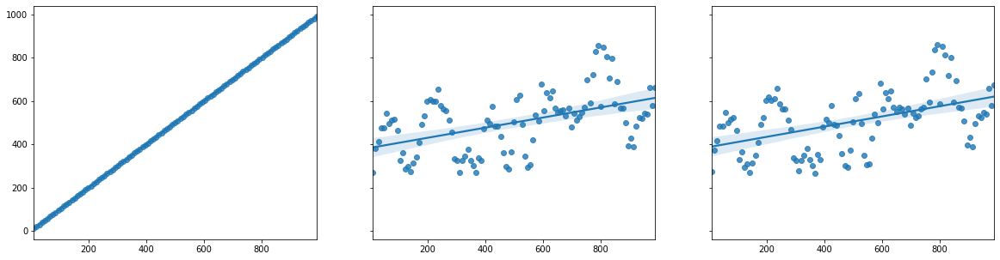

PktIn
r2_old  =  0.940516675664351 	 r2w_old =  0.940516675664351
r2_lat  =  0.9799498338391267 	 r2w_lat =  0.9799498338391267
r2_new  =  0.9799347745717162 	 r2w_new =  0.9799347745717162


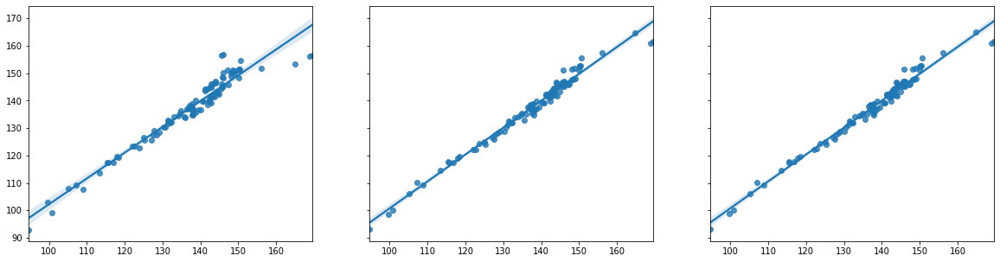

KBIn
r2_old  =  0.934337558319521 	 r2w_old =  0.9343375583195211
r2_lat  =  0.997890254279125 	 r2w_lat =  0.997890254279125
r2_new  =  0.9978922148758742 	 r2w_new =  0.9978922148758742


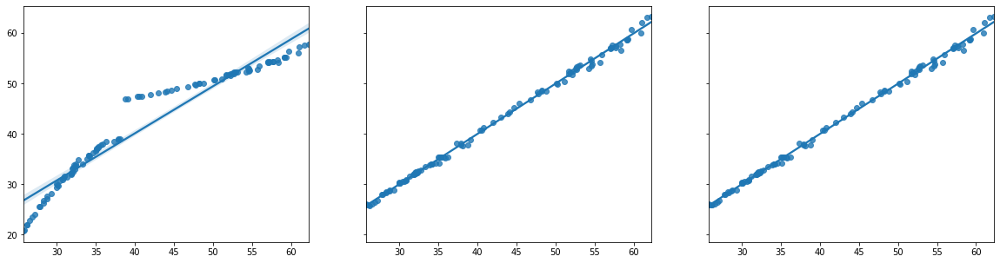

AVG_RR
r2_old  =  0.8723202066133597 	 r2w_old =  0.8723202066133596
r2_lat  =  0.9994578452398408 	 r2w_lat =  0.9994578452398407
r2_new  =  0.9994574010265453 	 r2w_new =  0.9994574010265453


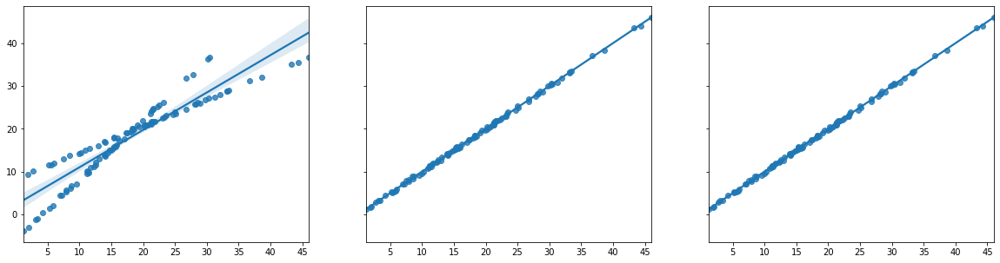

Inter
r2_old  =  0.5430054829639099 	 r2w_old =  0.5430054829639099
r2_lat  =  0.6204812301958387 	 r2w_lat =  0.6204812301958386
r2_new  =  0.6187682172945435 	 r2w_new =  0.6187682172945433


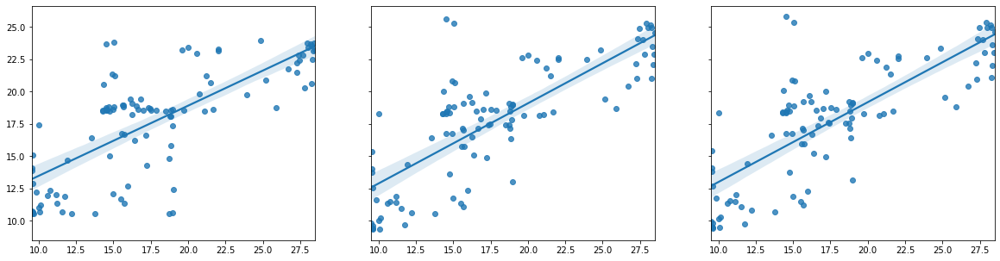

CTXSW
r2_old  =  0.9079654644261841 	 r2w_old =  0.9079654644261841
r2_lat  =  0.9788701012693711 	 r2w_lat =  0.9788701012693711
r2_new  =  0.9788721821870343 	 r2w_new =  0.9788721821870343


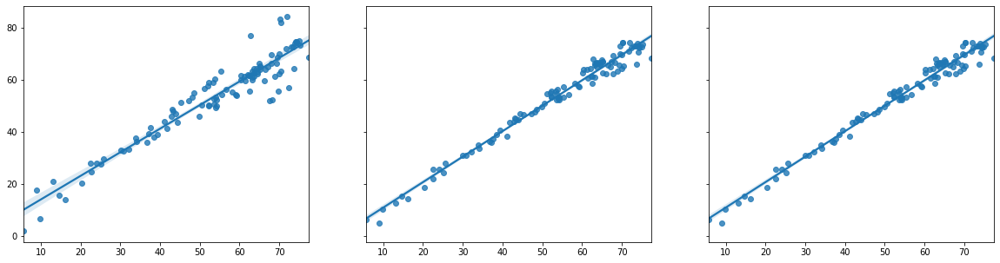

KBOut
r2_old  =  0.7882344260513253 	 r2w_old =  0.7882344260513253
r2_lat  =  0.9453732104827031 	 r2w_lat =  0.9453732104827031
r2_new  =  0.9454953196715842 	 r2w_new =  0.9454953196715842


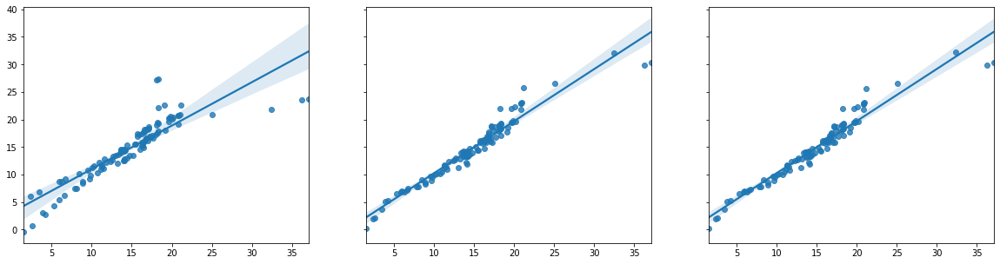

CPU
r2_old  =  0.7086003213852908 	 r2w_old =  0.7086003213852908
r2_lat  =  0.9995909029536911 	 r2w_lat =  0.999590902953691
r2_new  =  0.9995893291428172 	 r2w_new =  0.9995893291428171


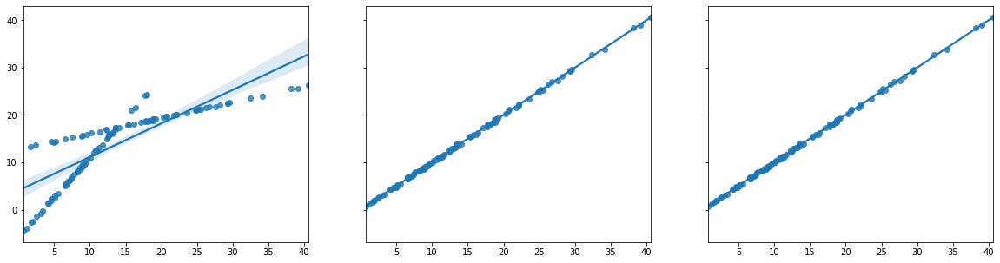

SUM_RR
r2_old  =  0.8564059722026107 	 r2w_old =  0.8564059722026108
r2_lat  =  0.9535161346056208 	 r2w_lat =  0.9535161346056209
r2_new  =  0.953303190707565 	 r2w_new =  0.953303190707565


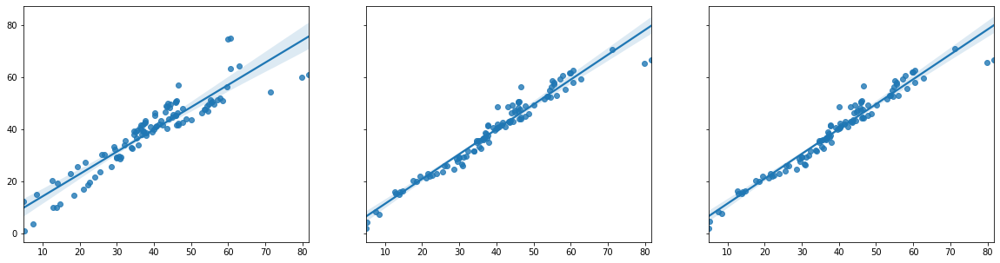

PktOut
r2_old  =  0.9512743941508266 	 r2w_old =  0.9512743941508266
r2_lat  =  0.9860651492433299 	 r2w_lat =  0.9860651492433299
r2_new  =  0.9860761425361693 	 r2w_new =  0.9860761425361693


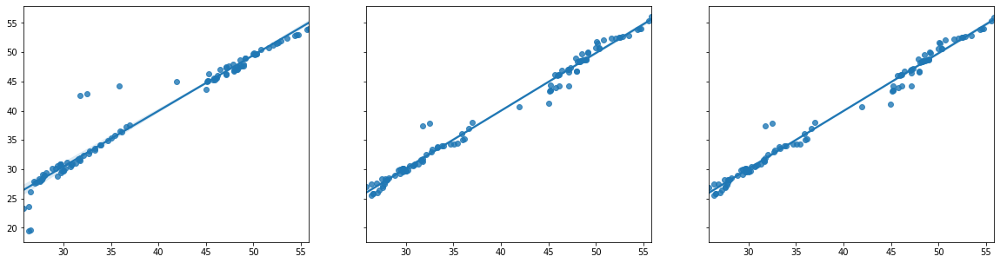

vm_number
r2_old  =  1.0 	 r2w_old =  1.0
r2_lat  =  1.0 	 r2w_lat =  1.0
r2_new  =  1.0 	 r2w_new =  1.0


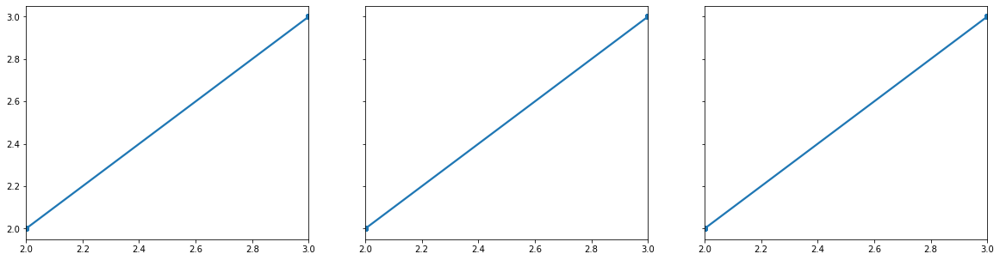

AVG_LAT_05
r2_old  =  0.9649791628644919 	 r2w_old =  0.9649791628644918
r2_lat  =  0.9917346031141937 	 r2w_lat =  0.9917346031141936
r2_new  =  0.991746982568835 	 r2w_new =  0.9917469825688351


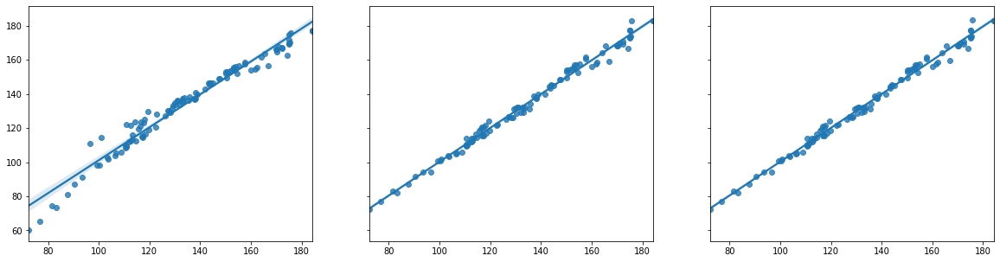

In [ ]:
# Regresszió
for i in df.columns:
  y     = fd[i].values               # Current
  x_old = fd[[str( i + '1' ), 'vm_number1', 'difference']].values
  x_new = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference', 'AVG_LAT_051']].values
  x_lat = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference']].values


  regression = LinearRegression()

  # fit old
  regression.fit(x_old, y)
  y_pred_old = regression.predict(x_old)
  r2_old  = r2_score(y, y_pred_old)
  r2w_old = r2_score(y, y_pred_old, multioutput='variance_weighted')

  # fit new
  regression.fit(x_new, y)
  y_pred_new = regression.predict(x_new)
  r2_new  = r2_score(y, y_pred_new)
  r2w_new = r2_score(y, y_pred_new, multioutput='variance_weighted')

  # fit without latency
  regression.fit(x_lat, y)
  y_pred_lat = regression.predict(x_lat)
  r2_lat  = r2_score(y, y_pred_lat)
  r2w_lat = r2_score(y, y_pred_lat, multioutput='variance_weighted')



  print(i)
  print('r2_old  = ', r2_old, '\t', 'r2w_old = ', r2w_old)
  print('r2_lat  = ', r2_lat, '\t', 'r2w_lat = ', r2w_lat)
  print('r2_new  = ', r2_new, '\t', 'r2w_new = ', r2w_new)


  fig, axes = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
  sns.regplot(ax=axes[0], x = y, y = y_pred_old)
  sns.regplot(ax=axes[1], x = y, y = y_pred_lat)
  sns.regplot(ax=axes[2], x = y, y = y_pred_new)
  # plt.savefig('before_after.png')
  plt.show()
  


In [ ]:
# NN, a request rate nélkül

In [ ]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

In [ ]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']

X = df[columns].values
y = df['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(4,),
                           max_iter=5,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.9660227007844673
r2 test  =  0.9306177154838168


In [ ]:
#@title

def crosscorr(datax, datay, lag=0):
    """ Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    """
    return datax.corr(datay.shift(lag))

def save_mlp(name):
  filename = name
  pickle.dump(mlp, open(filename, 'wb'))

def load_mlp(name):
  mlp = pickle.load(open(filename, 'rb'))
  return mlp

def timeline_plot(real, estimated):
  plt.figure(figsize=(20, 6))
  plt.plot(real, label = 'Real')
  plt.plot(estimated, label = 'Estimated')
  plt.title('Estimated vs Real values', fontsize=18)
  plt.ylabel('Average Latency - Normalized', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  a1.scatter(y_train, y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  a2.scatter(y_test, y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  sns.regplot(ax=a1, x = y_train, y = y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  a1.set_ylim(-0.05, 1.05)
  a1.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  sns.regplot(ax=a2, x = y_test, y = y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  a2.set_ylim(-0.05, 1.05)
  a2.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummulative_plots(errors, cummulative_errors, y_real, y_predicted):
  plt.figure(figsize=(20,4))
  plt.plot(errors, label='Error per estimation')
  plt.ylabel('Error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(cummulative_errors, label='Cummulative error')
  plt.ylabel('Cumulative error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(y_predicted, label='predicted')
  plt.plot(y_real, label='real')
  plt.ylabel('Average Latency', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def cummaulative_real_predicted_scatter(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  plt.scatter(y_real, y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummaulative_real_predicted_scatter_sns(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  sns.regplot(x = y_real, y = y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  plt.ylim(-0.05, 1.05)
  plt.xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def timeline(variable):
  plt.figure(figsize=(20,4))
  plt.plot(variable, label='Timeseries')
  plt.ylabel('Value', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()


In [ ]:
#@title

def crosscorr(datax, datay, lag=0):
    """ Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    """
    return datax.corr(datay.shift(lag))

def save_mlp(name):
  filename = name
  pickle.dump(mlp, open(filename, 'wb'))

def load_mlp(name):
  mlp = pickle.load(open(filename, 'rb'))
  return mlp

def timeline_plot(real, estimated):
  plt.figure(figsize=(20, 6))
  plt.plot(real, label = 'Real')
  plt.plot(estimated, label = 'Estimated')
  plt.title('Estimated vs Real values', fontsize=18)
  plt.ylabel('Average Latency - Normalized', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  a1.scatter(y_train, y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  a2.scatter(y_test, y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  sns.regplot(ax=a1, x = y_train, y = y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  a1.set_ylim(-0.05, 1.05)
  a1.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  sns.regplot(ax=a2, x = y_test, y = y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  a2.set_ylim(-0.05, 1.05)
  a2.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummulative_plots(errors, cummulative_errors, y_real, y_predicted):
  plt.figure(figsize=(20,4))
  plt.plot(errors, label='Error per estimation')
  plt.ylabel('Error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(cummulative_errors, label='Cummulative error')
  plt.ylabel('Cumulative error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(y_predicted, label='predicted')
  plt.plot(y_real, label='real')
  plt.ylabel('Average Latency', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def cummaulative_real_predicted_scatter(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  plt.scatter(y_real, y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummaulative_real_predicted_scatter_sns(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  sns.regplot(x = y_real, y = y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  plt.ylim(-0.05, 1.05)
  plt.xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def timeline(variable):
  plt.figure(figsize=(20,4))
  plt.plot(variable, label='Timeseries')
  plt.ylabel('Value', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()


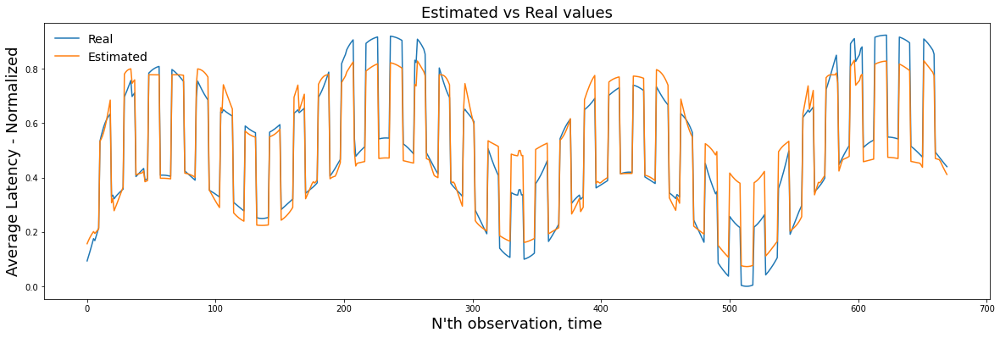

In [ ]:
timeline_plot(y_train, y_pred_train)

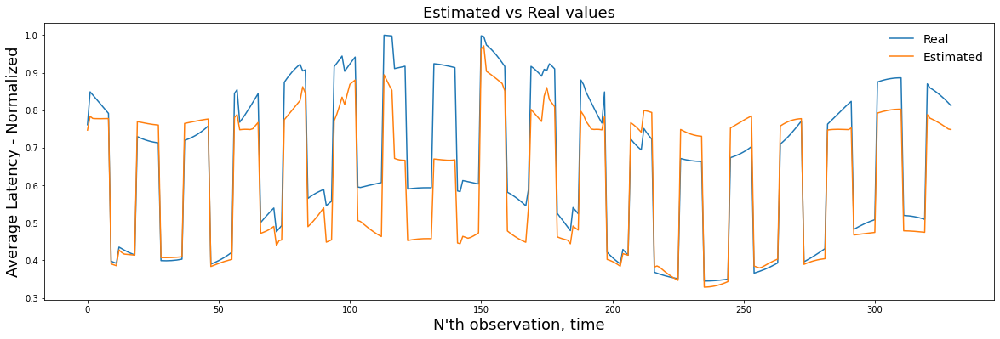

In [ ]:
timeline_plot(y_test, y_pred_test)

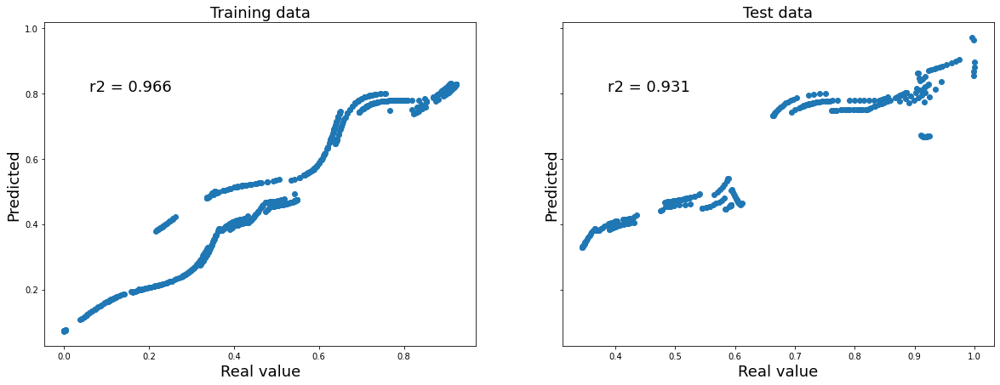

In [ ]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

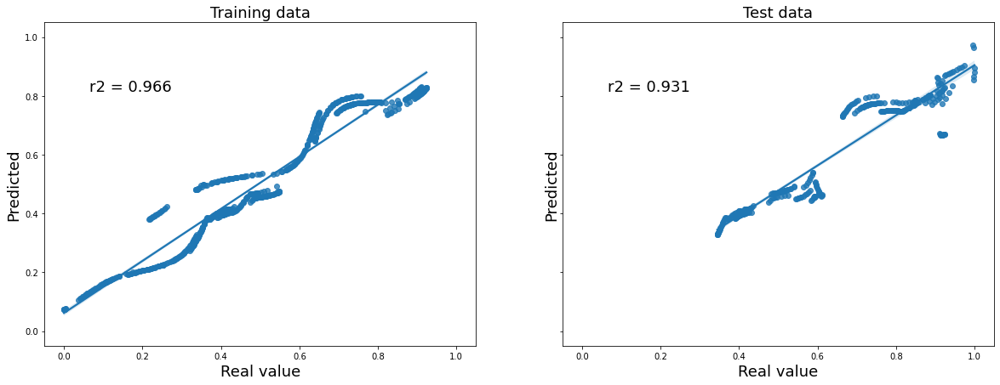

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

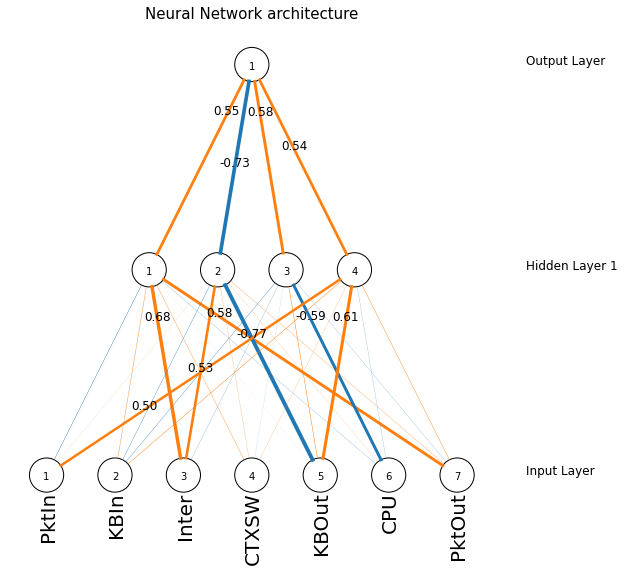

In [ ]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [ ]:
# NN request rate nélkül laggal

In [ ]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [ ]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=4,
                           max_iter=10,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.9803355747016137
r2 test  =  0.9563836628988215


In [ ]:
load = False
model = '2_model.sav'
if (load == True):
  mlp = load_mplp(model)
else:
  save_mlp(model)

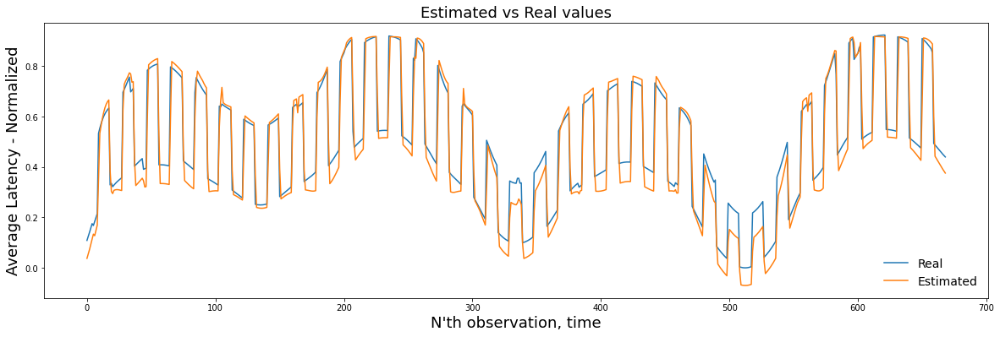

In [ ]:
timeline_plot(y_train, y_pred_train)

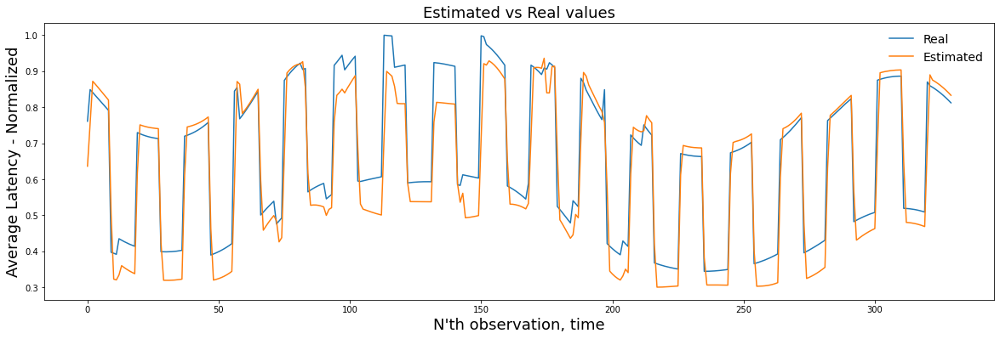

In [ ]:
timeline_plot(y_test, y_pred_test)

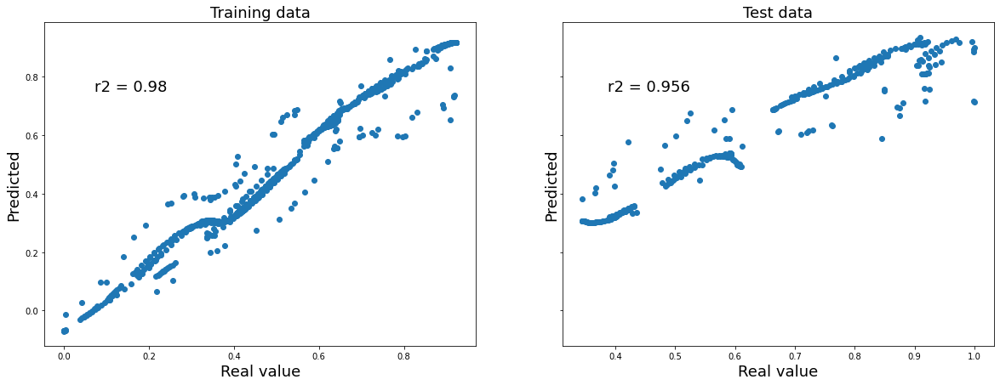

In [ ]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

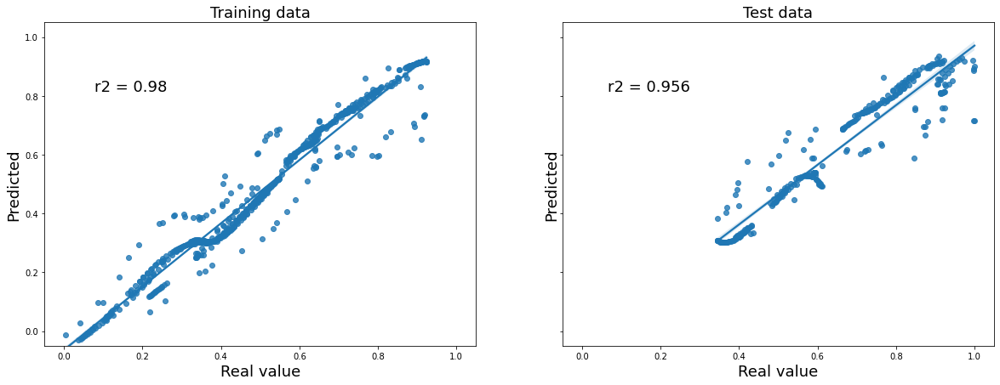

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

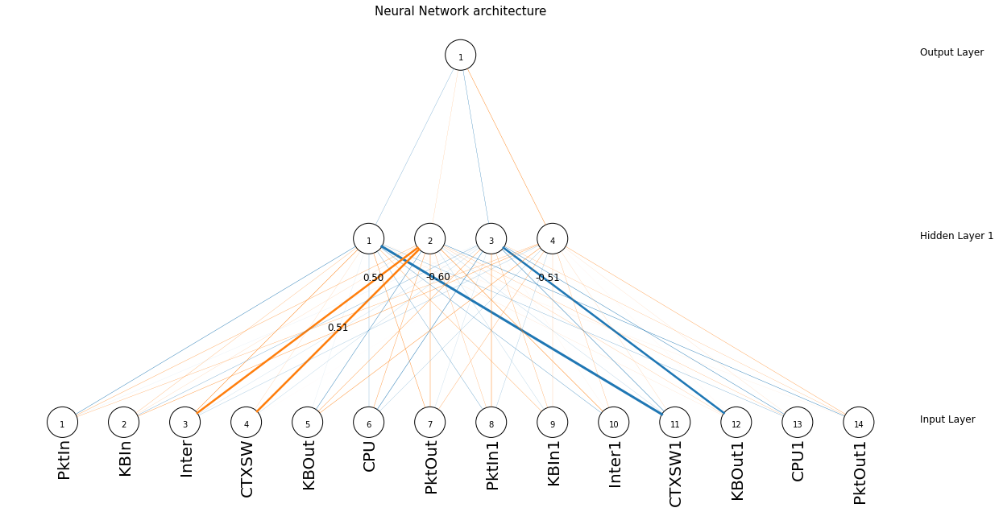

In [ ]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [ ]:
# NN request rate nélkül laggal összetettem neurális hálóval

In [ ]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [ ]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                           max_iter=15,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.9932269025072528
r2 test  =  0.98199187805137


In [ ]:
model = '3_model.sav'
if (load == True):
  mlp = load_mplp(model)
else:
  save_mlp(model)

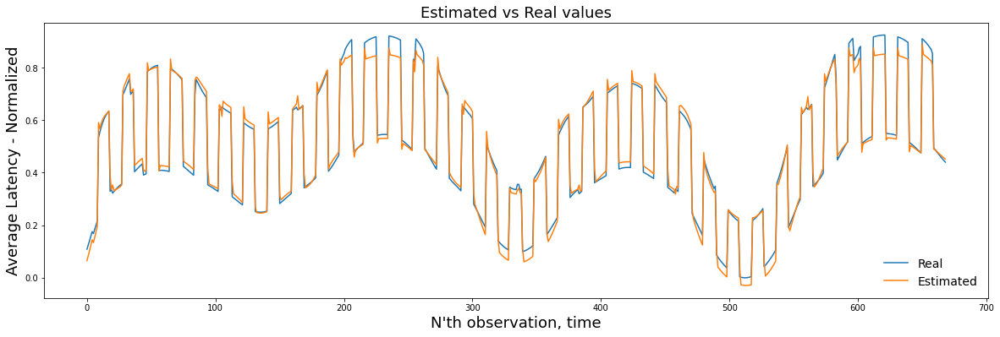

In [ ]:
timeline_plot(y_train, y_pred_train)

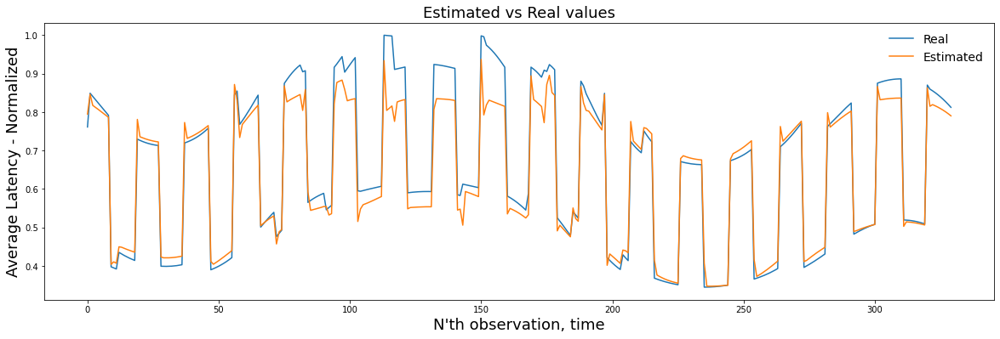

In [ ]:
timeline_plot(y_test, y_pred_test)

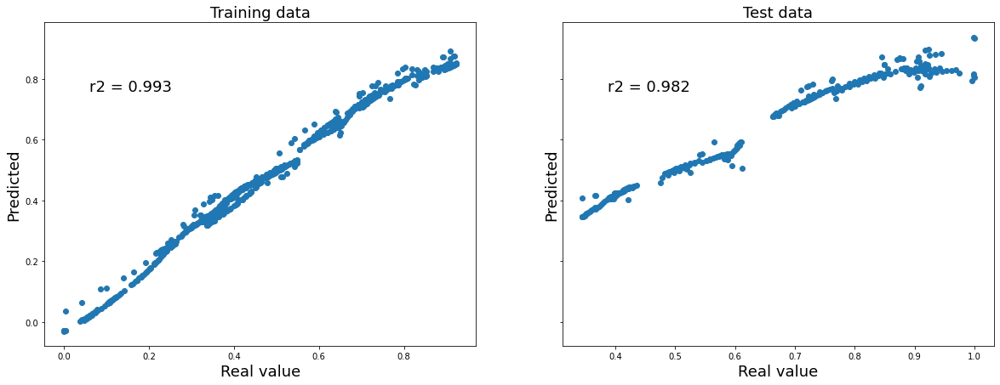

In [ ]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

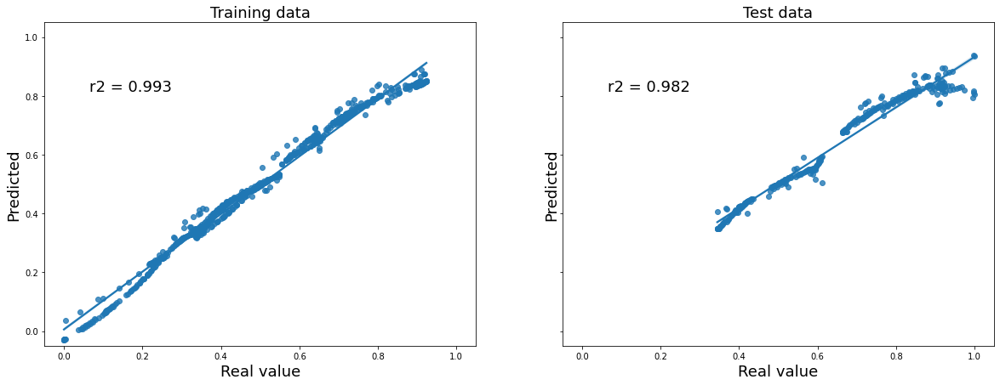

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

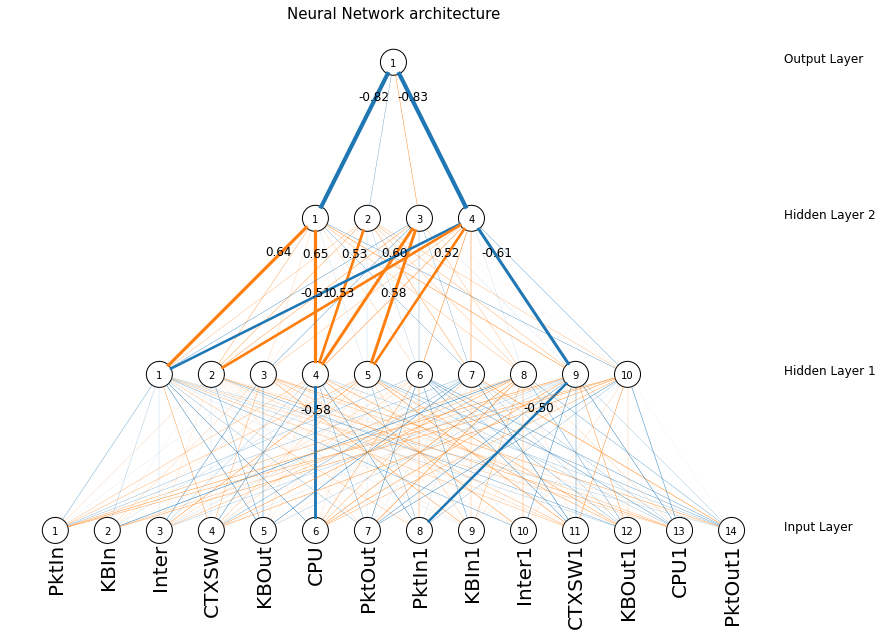

In [ ]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [ ]:
# NN, lag nélkül és laggal

In [ ]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

In [ ]:
columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']

X = df[columns].values
y = df['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8701441728634379
r2 test  =  0.5830658711085674


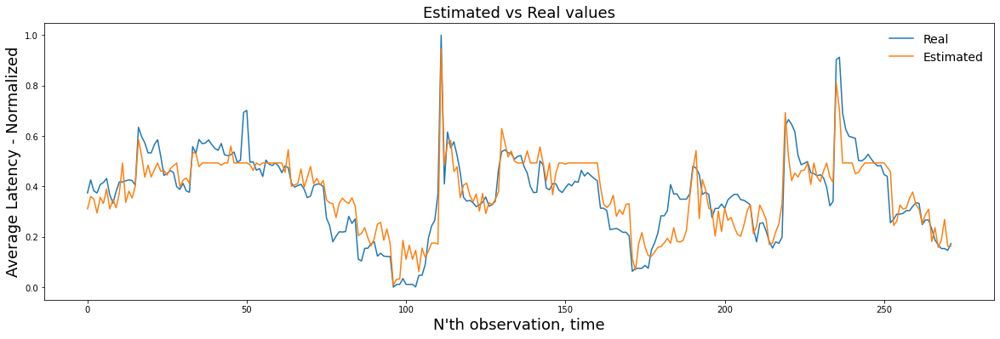

In [ ]:
timeline_plot(y_train, y_pred_train)

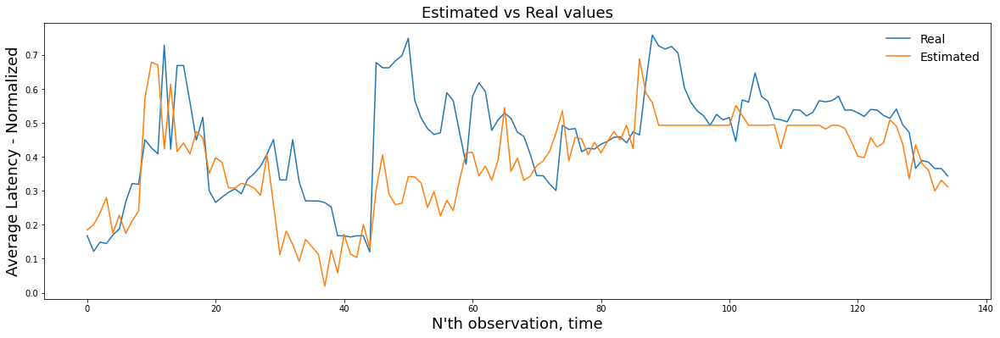

In [ ]:
timeline_plot(y_test, y_pred_test)

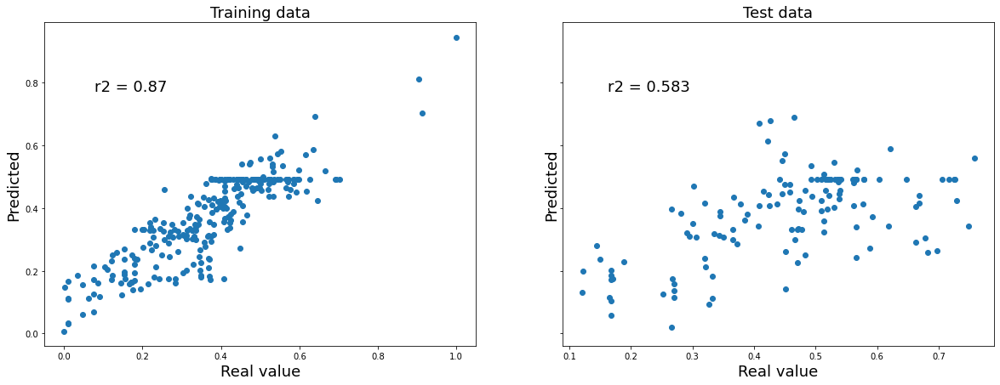

In [ ]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

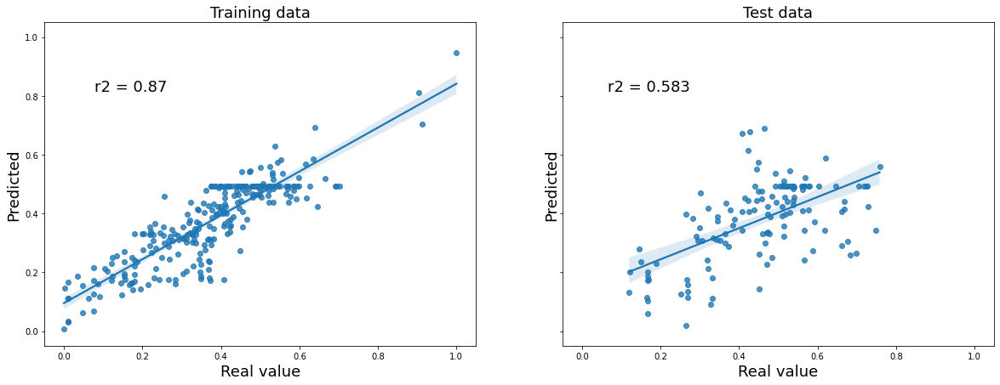

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

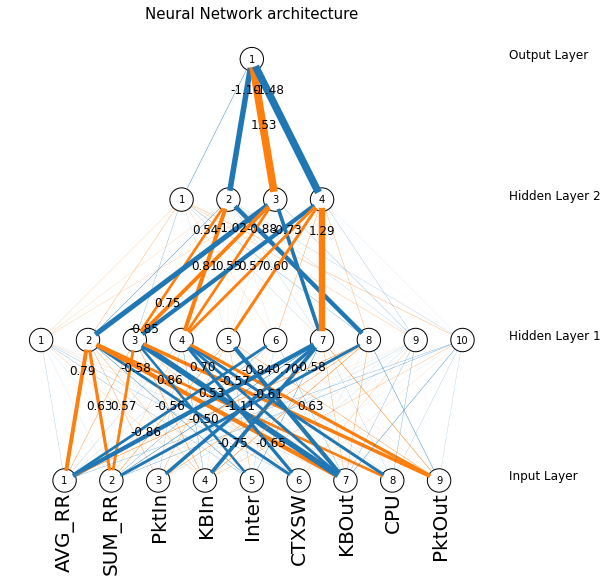

In [ ]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [ ]:
# NN laggal

In [ ]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [ ]:
columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=4,
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8216792810035435
r2 test  =  0.6396158213829503


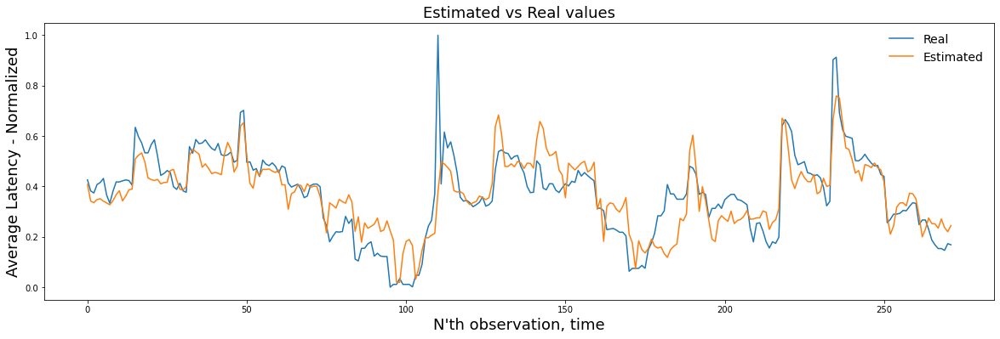

In [ ]:
timeline_plot(y_train, y_pred_train)

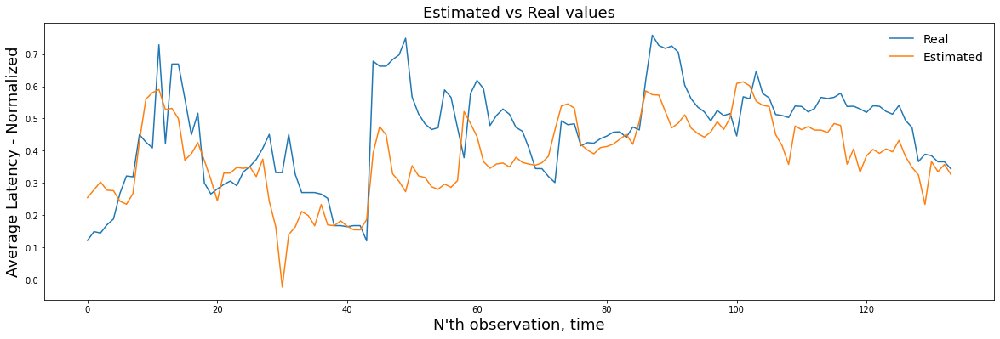

In [ ]:
timeline_plot(y_test, y_pred_test)

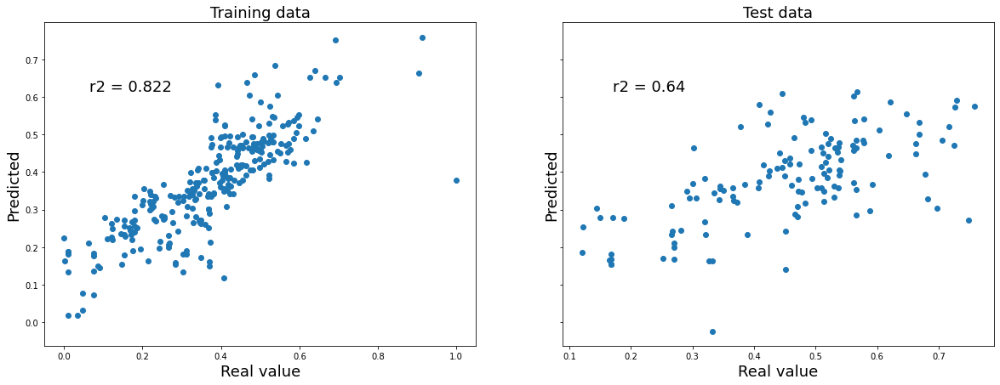

In [ ]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

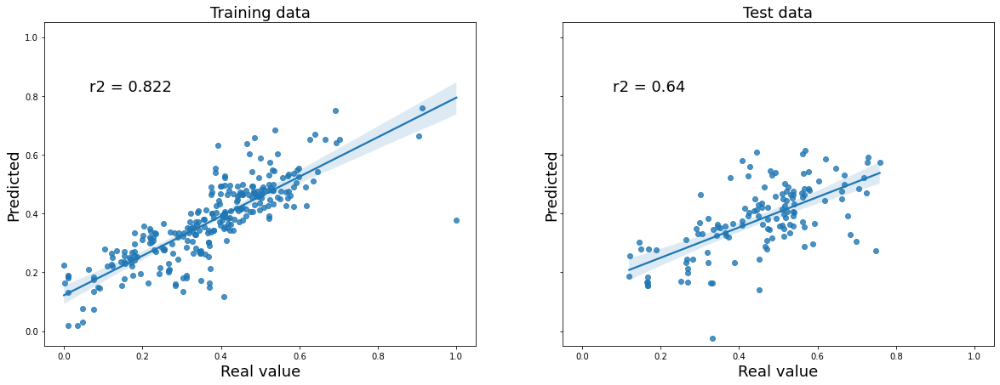

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

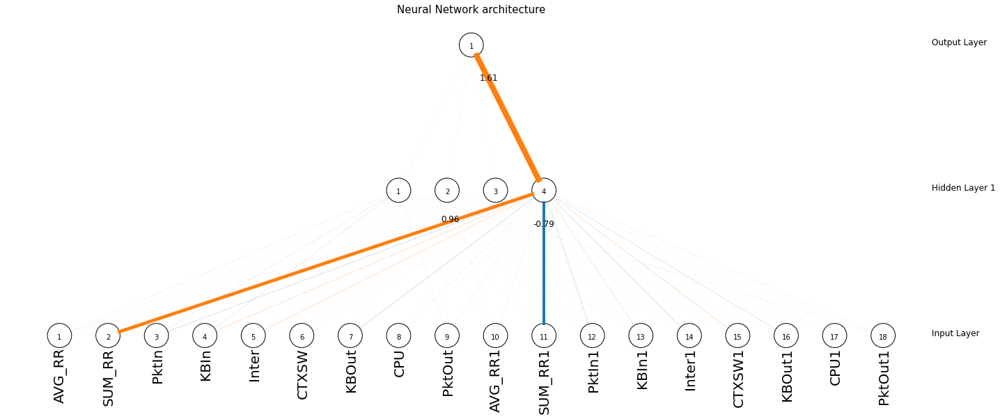

In [ ]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [ ]:
# kumulatív hiba számolásával

In [ ]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]


  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=4,
                            max_iter=10,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  # print('r2 train = ', r2_train)

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.993568889419816
step =  200 	 r2 =  0.9946777889744985
step =  250 	 r2 =  0.9951259577450279
step =  300 	 r2 =  0.9954909543194153
step =  350 	 r2 =  0.9948851604196151
step =  400 	 r2 =  0.9942319122467719
step =  450 	 r2 =  0.9936461056754815
step =  500 	 r2 =  0.9928781577260627
step =  550 	 r2 =  0.9918520972152186
step =  600 	 r2 =  0.9915854272013515
step =  650 	 r2 =  0.9905981010091115
step =  700 	 r2 =  0.990199033410006
step =  750 	 r2 =  0.990091695839661
step =  800 	 r2 =  0.988944784321089
step =  850 	 r2 =  0.9885932350784078
step =  900 	 r2 =  0.9873193692637723
step =  950 	 r2 =  0.9855533715583256


[35.79413121]


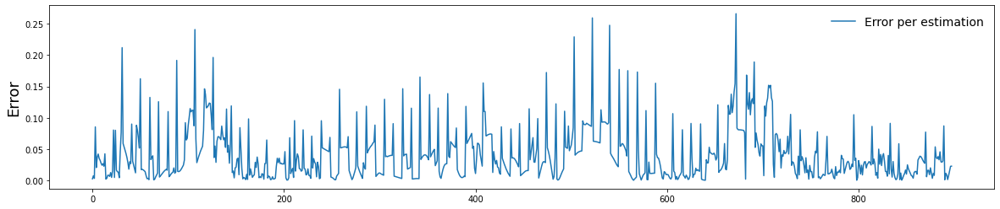

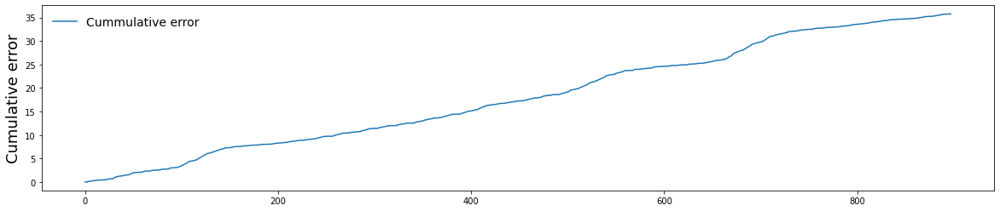

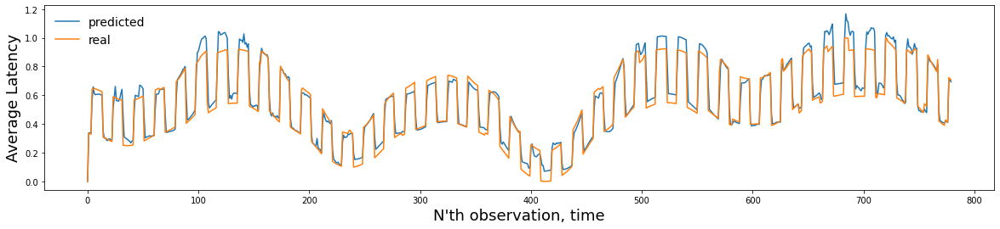

In [ ]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [ ]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.9837026693733324

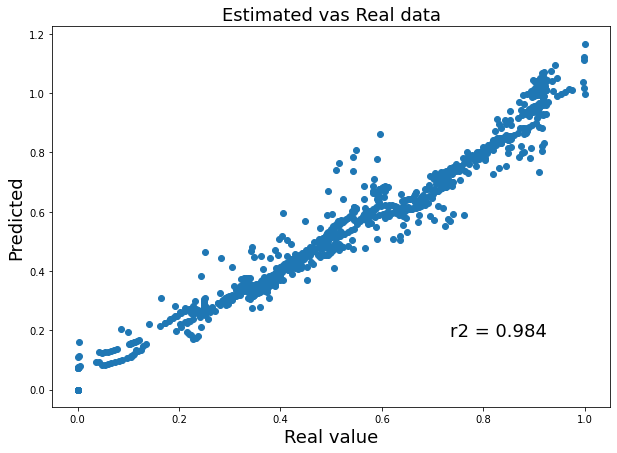

In [ ]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

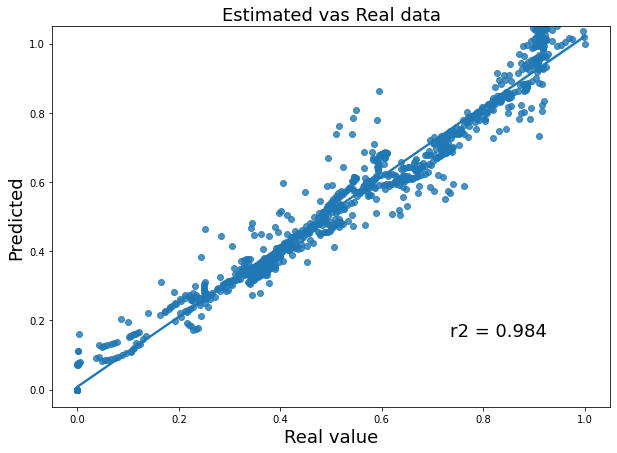

In [ ]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)

In [ ]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]


  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=4,
                            max_iter=10,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  # print('r2 train = ', r2_train)

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.993568889419816
step =  200 	 r2 =  0.9946777889744985
step =  250 	 r2 =  0.9951259577450279
step =  300 	 r2 =  0.9954909543194153
step =  350 	 r2 =  0.9948851604196151
step =  400 	 r2 =  0.9942319122467719
step =  450 	 r2 =  0.9936461056754815
step =  500 	 r2 =  0.9928781577260627
step =  550 	 r2 =  0.9918520972152186
step =  600 	 r2 =  0.9915854272013515
step =  650 	 r2 =  0.9905981010091115
step =  700 	 r2 =  0.990199033410006
step =  750 	 r2 =  0.990091695839661
step =  800 	 r2 =  0.988944784321089
step =  850 	 r2 =  0.9885932350784078
step =  900 	 r2 =  0.9873193692637723
step =  950 	 r2 =  0.9855533715583256


[35.79413121]


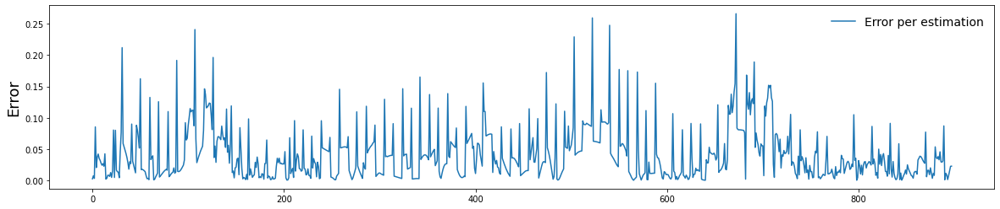

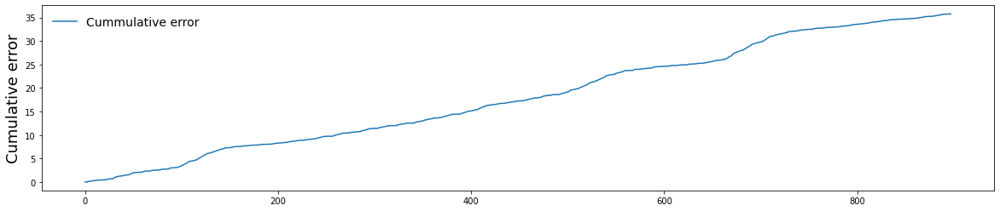

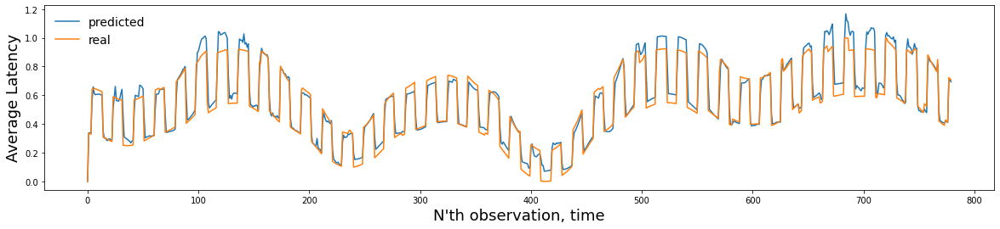

In [ ]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [ ]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.9837026693733324

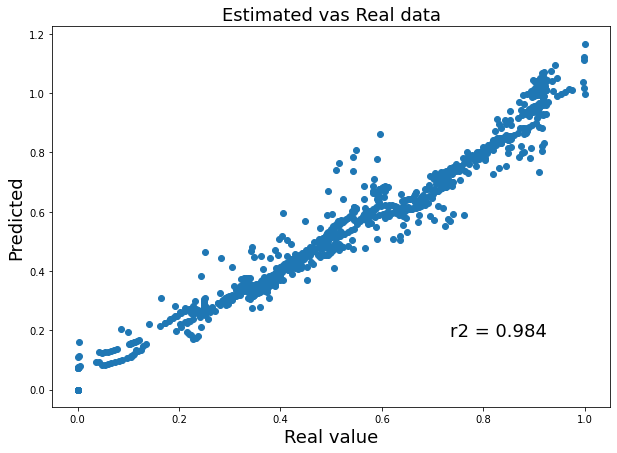

In [ ]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

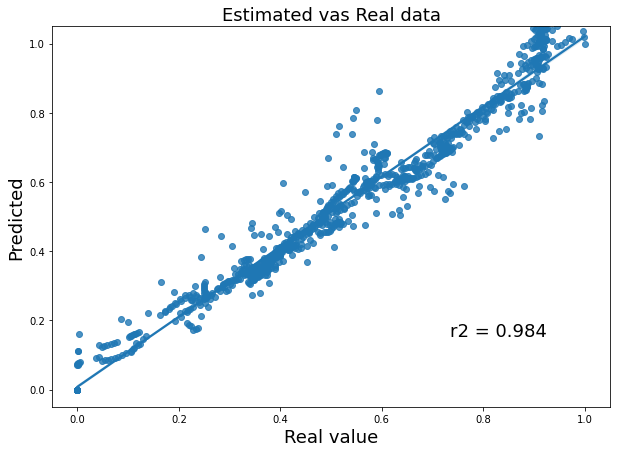

In [ ]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)

In [ ]:
# lagok nélküli futó hiba

In [ ]:
X = ba[['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=4,
                            max_iter=10,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  # print('r2 train = ', r2_train)

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  0.9999999999999925
step =  150 	 r2 =  0.9721923183864121
step =  200 	 r2 =  0.9828670140927369
step =  250 	 r2 =  0.9902587700659702
step =  300 	 r2 =  0.991265625144843
step =  350 	 r2 =  0.9888266761839477
step =  400 	 r2 =  0.9879771637278761
step =  450 	 r2 =  0.9882228982816268
step =  500 	 r2 =  0.9861265848032127
step =  550 	 r2 =  0.982624761348775
step =  600 	 r2 =  0.9821273141508869
step =  650 	 r2 =  0.9828148694254404
step =  700 	 r2 =  0.9825181660043324
step =  750 	 r2 =  0.982180500862472
step =  800 	 r2 =  0.9809814317871717
step =  850 	 r2 =  0.9789546809814643
step =  900 	 r2 =  0.9771589756575167
step =  950 	 r2 =  0.9738393855214968


[52.8981409]


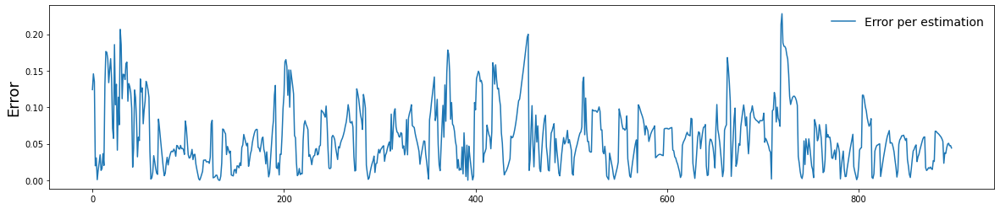

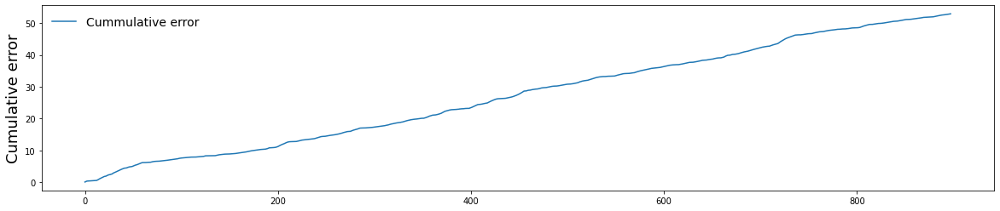

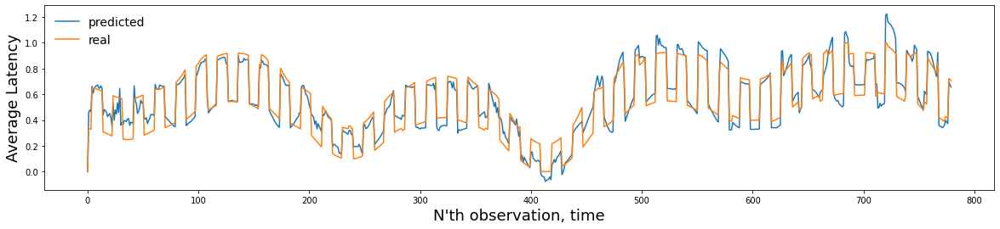

In [ ]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [ ]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.971239266754822

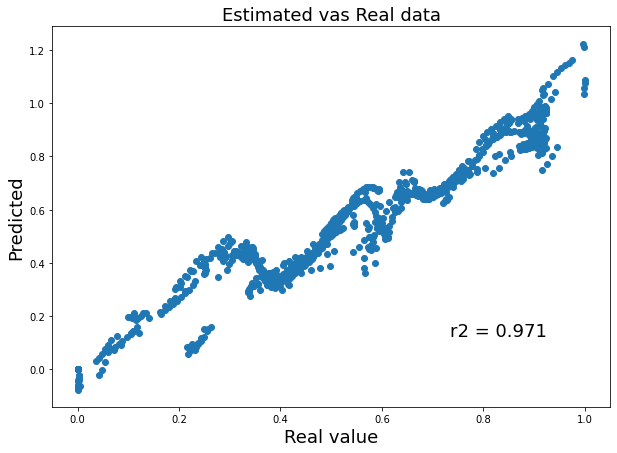

In [ ]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

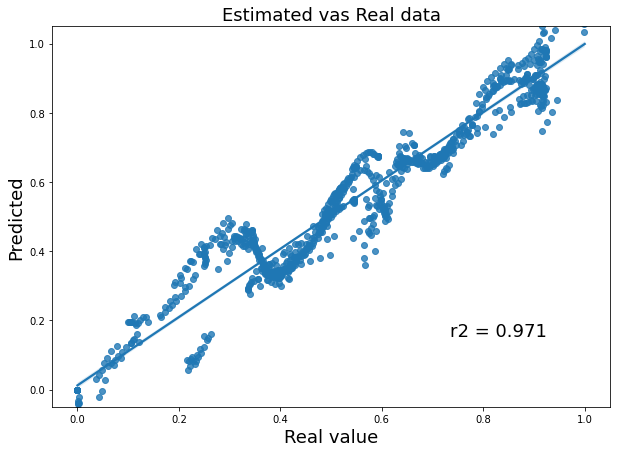

In [ ]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)

In [ ]:
# lagok nélküli futó hiba összetetteb hálóval

In [ ]:
X = ba[['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=10,
                            max_iter=20,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9999109757087166
step =  200 	 r2 =  0.999916717370445
step =  250 	 r2 =  0.9998546144735493
step =  300 	 r2 =  0.999856666472607
step =  350 	 r2 =  0.9997811720012497
step =  400 	 r2 =  0.9997785283704645
step =  450 	 r2 =  0.9997795621248314
step =  500 	 r2 =  0.9997499933255461
step =  550 	 r2 =  0.9997128542270775
step =  600 	 r2 =  0.999713520880862
step =  650 	 r2 =  0.9997041633585579
step =  700 	 r2 =  0.9996866928295418
step =  750 	 r2 =  0.999677614062228
step =  800 	 r2 =  0.999296598156201
step =  850 	 r2 =  0.9991893460900756
step =  900 	 r2 =  0.9990965426872501
step =  950 	 r2 =  0.9989812393734204


[9.08261712]


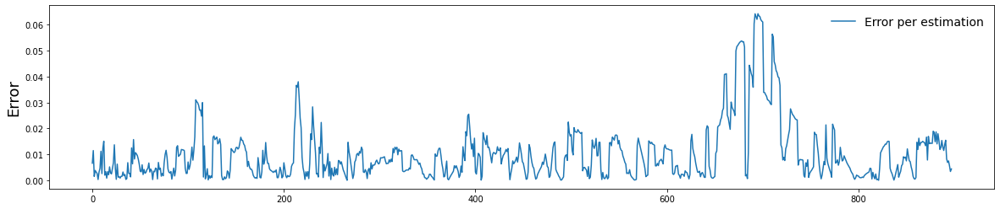

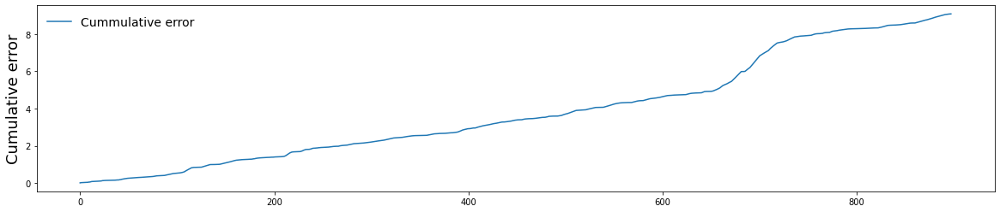

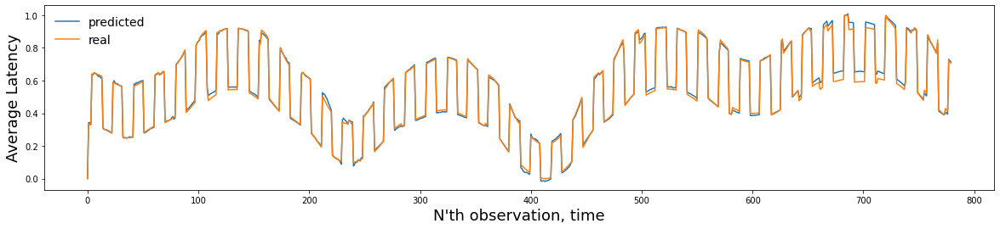

In [ ]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [ ]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.998811094144211

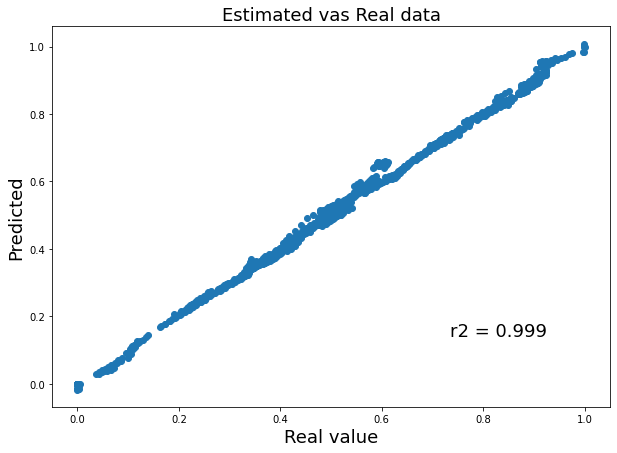

In [ ]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

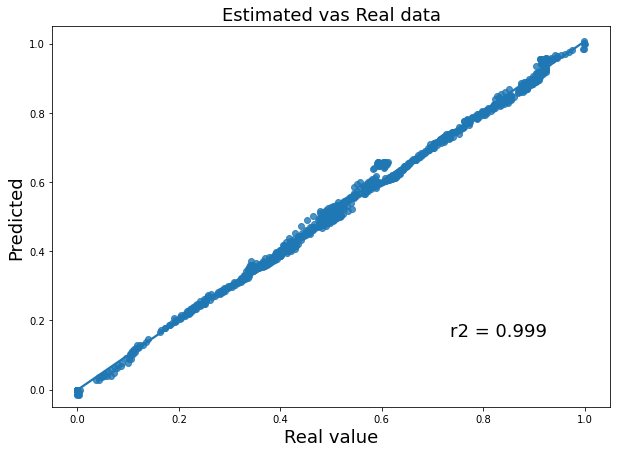

In [ ]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)


<a name="play_ground"></a>

# Playground

Itt ki lehet próbálni mindeféle beállítást, és ha találok valami érdkeset akkor azt tovább lehet gondolni

[Vissza](#tartalom)<br>


In [ ]:
playground_cumulative_errors = []

In [ ]:
def playground_plots(playground_cumulative_errors=None):
  if(len(playground_cumulative_errors) > 0):
    plt.figure(figsize=(20,6))
    for i in playground_cumulative_errors:
      plt.plot(i[2], label = str(i[0]))
      plt.ylabel('Cumulative error', fontsize=18)
      plt.legend(fontsize=14, frameon=False)
    plt.show()


In [ ]:
# NN laggal

In [ ]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [ ]:
columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']


X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                           max_iter=1000,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.9999875274526773
r2 test  =  0.9981810558163637


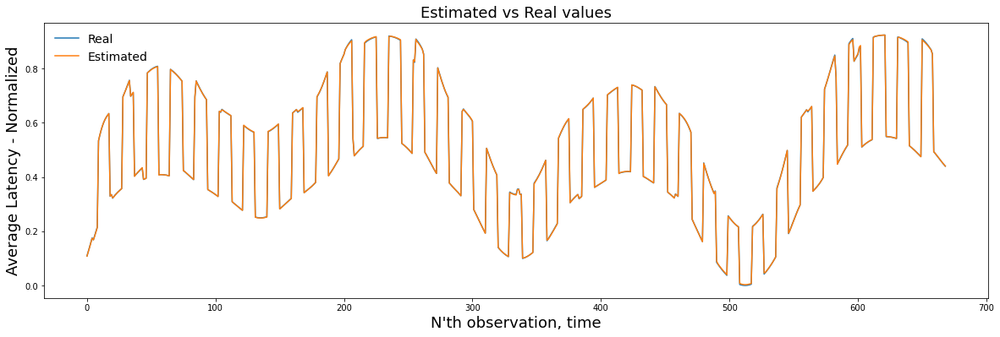

In [ ]:
timeline_plot(y_train, y_pred_train)

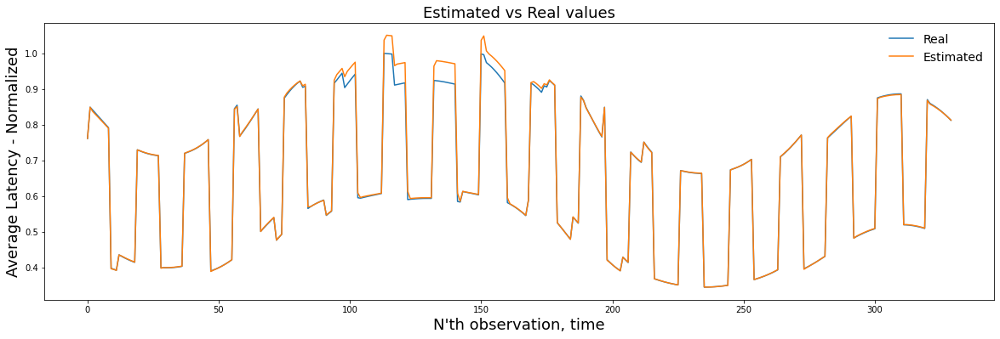

In [ ]:
timeline_plot(y_test, y_pred_test)

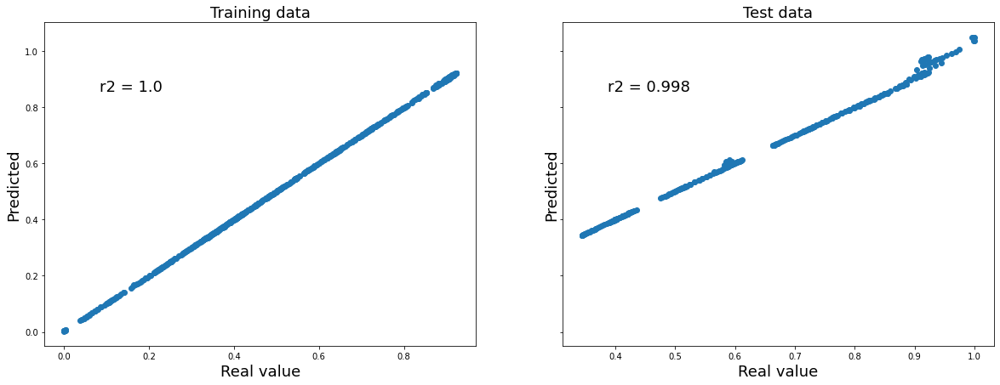

In [ ]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

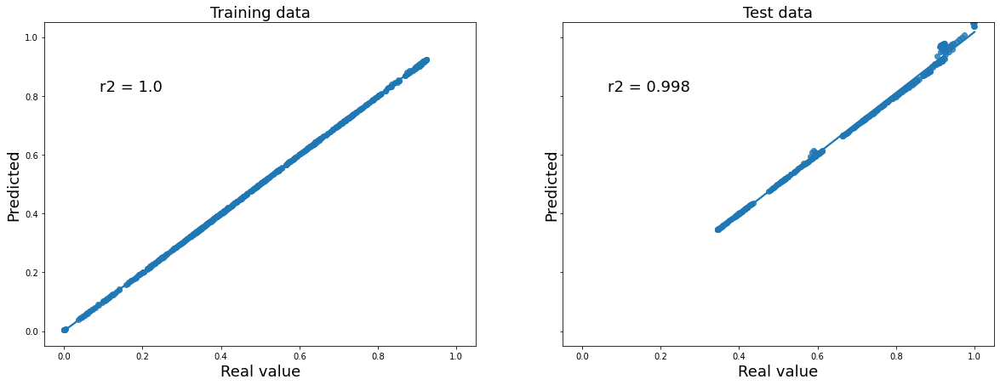

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

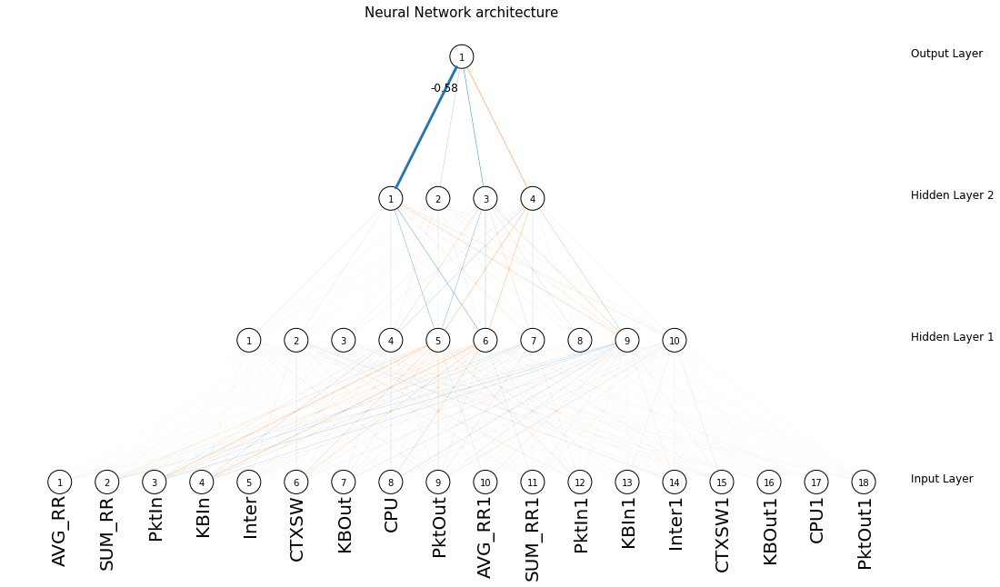

In [ ]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [ ]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                     max_iter=i,
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.01,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'elso'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9999654750014542
step =  200 	 r2 =  0.9999755670468753
step =  250 	 r2 =  0.999968924508207
step =  300 	 r2 =  0.9999744262622249
step =  350 	 r2 =  0.9999616991367775
step =  400 	 r2 =  0.9999633786692265
step =  450 	 r2 =  0.9999669247681099


KeyboardInterrupt: ignored

[31.71988592]


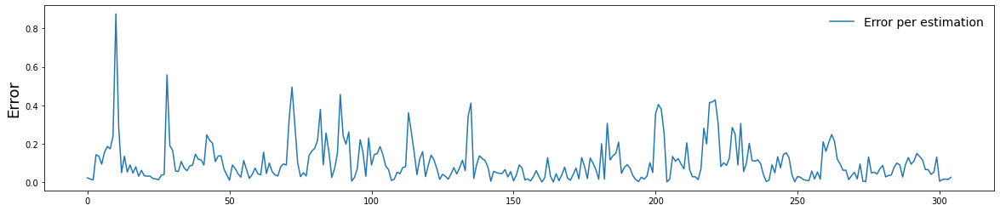

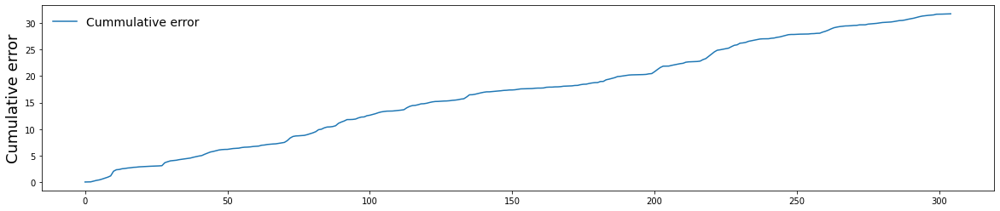

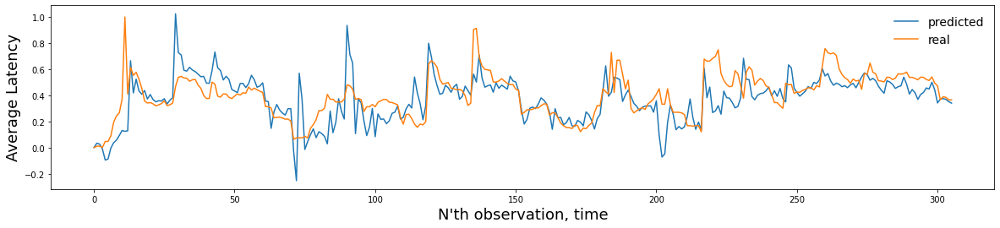

In [ ]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

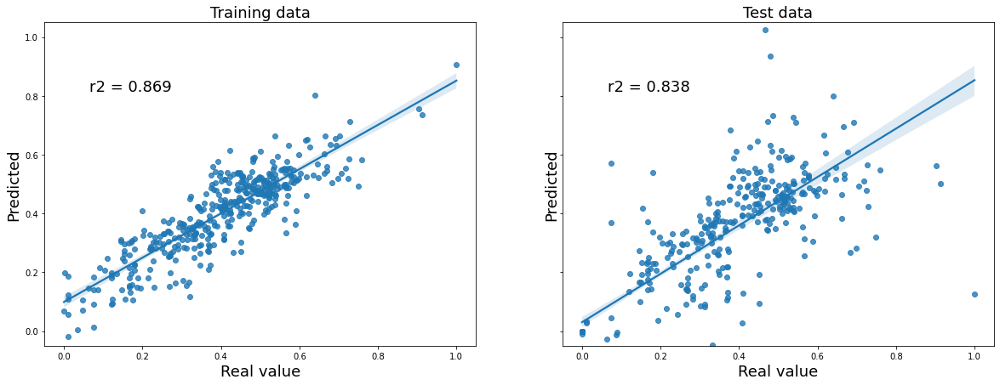

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_real, y_pred_train, y_predicted)

In [ ]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                     max_iter=10,
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.01,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'masoidk'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  0.9999999999999997
step =  150 	 r2 =  0.9979524220034837
step =  200 	 r2 =  0.9979819831537873
step =  250 	 r2 =  0.996737411668621
step =  300 	 r2 =  0.9971093179962325
step =  350 	 r2 =  0.9966848052661139
step =  400 	 r2 =  0.9967811250552089
step =  450 	 r2 =  0.9969733071971221
step =  500 	 r2 =  0.9963770992287465
step =  550 	 r2 =  0.9960745755926446
step =  600 	 r2 =  0.9960619211573953
step =  650 	 r2 =  0.995818522739214
step =  700 	 r2 =  0.9958966159789201
step =  750 	 r2 =  0.9959003770004812
step =  800 	 r2 =  0.9949240168449011
step =  850 	 r2 =  0.9941536564438235
step =  900 	 r2 =  0.993689875398447
step =  950 	 r2 =  0.9929785508596649


[23.41297807]


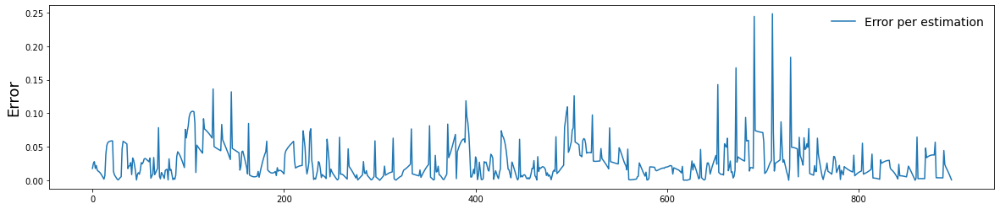

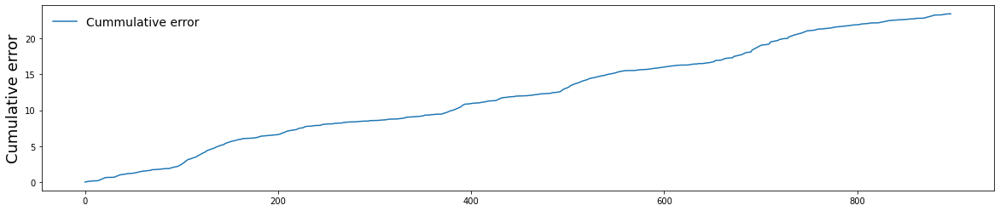

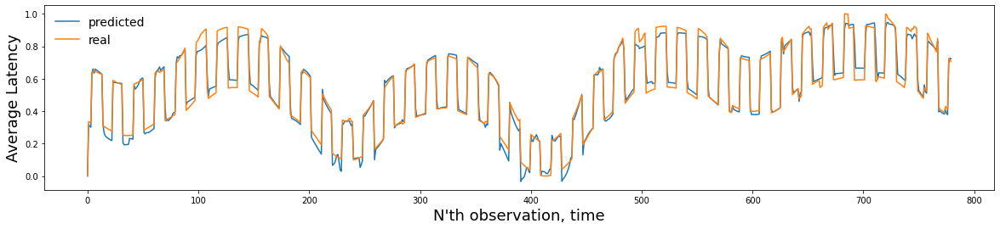

In [ ]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

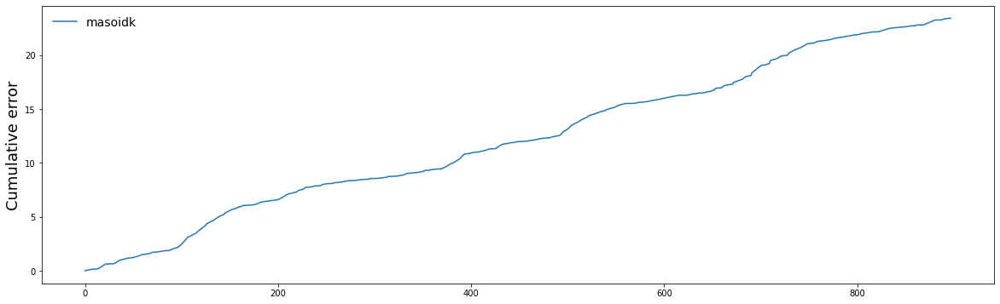

In [ ]:
playground_plots(playground_cumulative_errors)

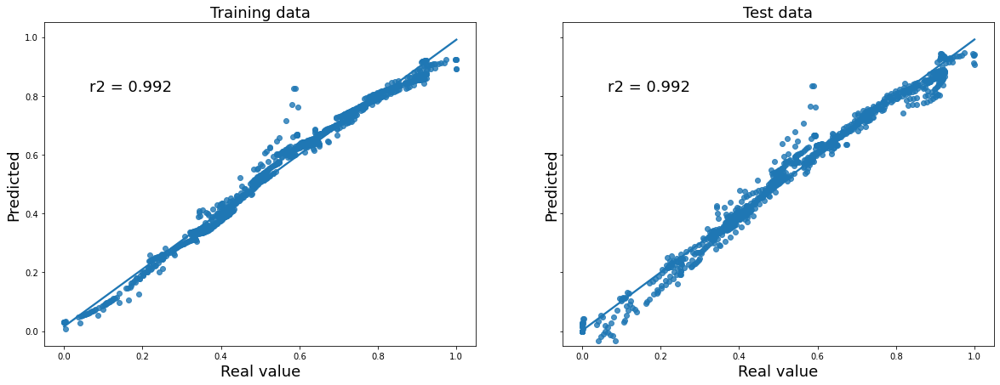

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_real, y_pred_train, y_predicted)

In [ ]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                     max_iter=int(i/3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.01,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'harmadik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.875571474732233
step =  200 	 r2 =  0.8679372772776998
step =  250 	 r2 =  0.8948649667359291
step =  300 	 r2 =  0.8886391237771593
step =  350 	 r2 =  0.8585833158744904
step =  400 	 r2 =  0.8535157523006698


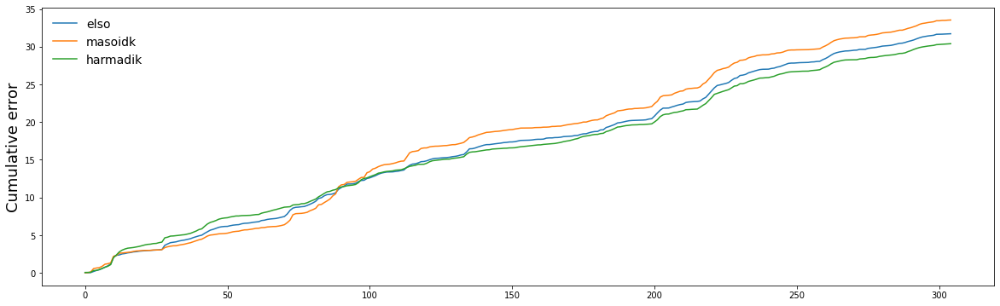

In [ ]:
playground_plots(playground_cumulative_errors)

In [ ]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(20,10),
                     max_iter=int(i/3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.1,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'negyedik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  -0.9999999999999901
step =  150 	 r2 =  0.9099000470572457
step =  200 	 r2 =  0.8993058978701706
step =  250 	 r2 =  0.9197524327010987
step =  300 	 r2 =  0.9126820969530538
step =  350 	 r2 =  0.8733560763178666
step =  400 	 r2 =  0.8685274407912124


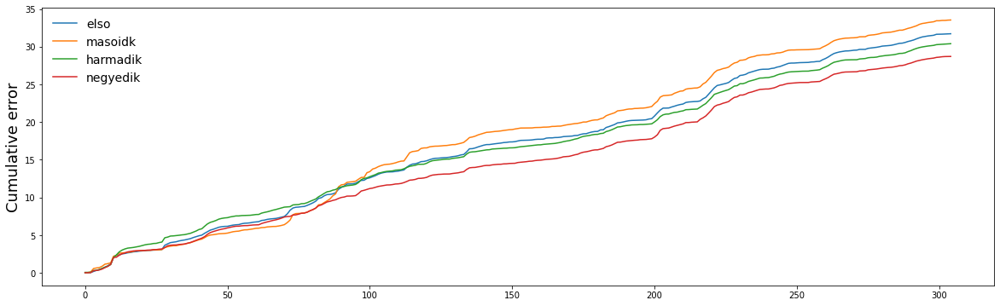

In [ ]:
playground_plots(playground_cumulative_errors)

In [ ]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']


X = ba[columns].values
y = ba['AVG_LAT_05']

errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[i-10:i,:]
  y_train = y_scaled[i-10:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(20,10),
                     max_iter=int(i*3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.099,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.09,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'ötödik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9127428634918163
step =  200 	 r2 =  0.9162471138684741
step =  250 	 r2 =  0.9209960298569078
step =  300 	 r2 =  0.8703448335341558
step =  350 	 r2 =  0.8585868327650383
step =  400 	 r2 =  0.8531477991990808


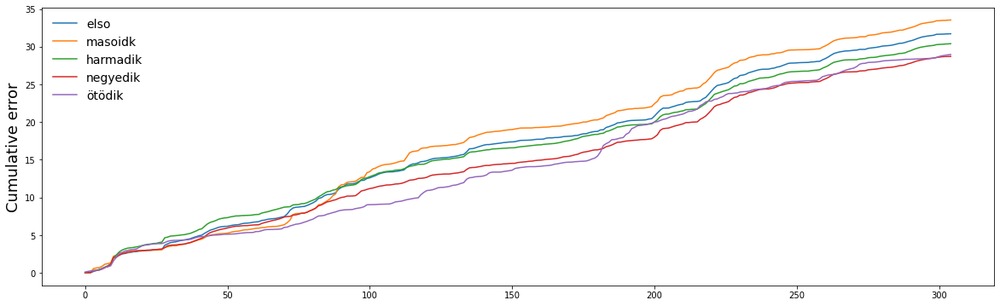

In [ ]:
playground_plots(playground_cumulative_errors)

[28.96315652]


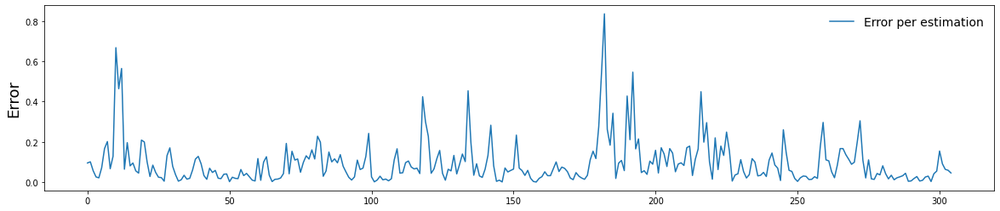

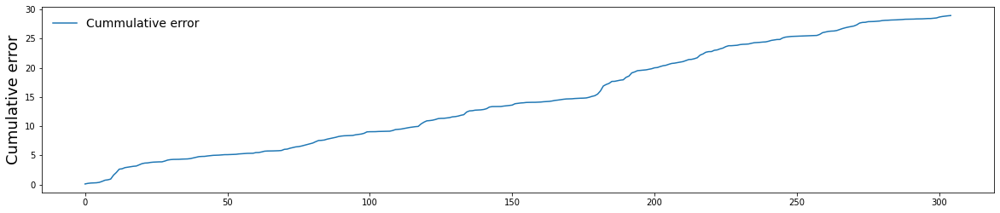

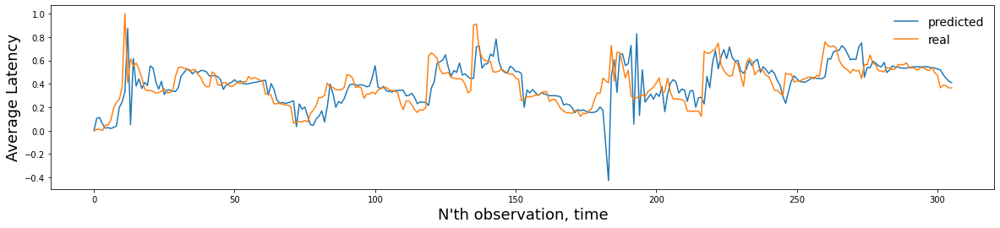

In [ ]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

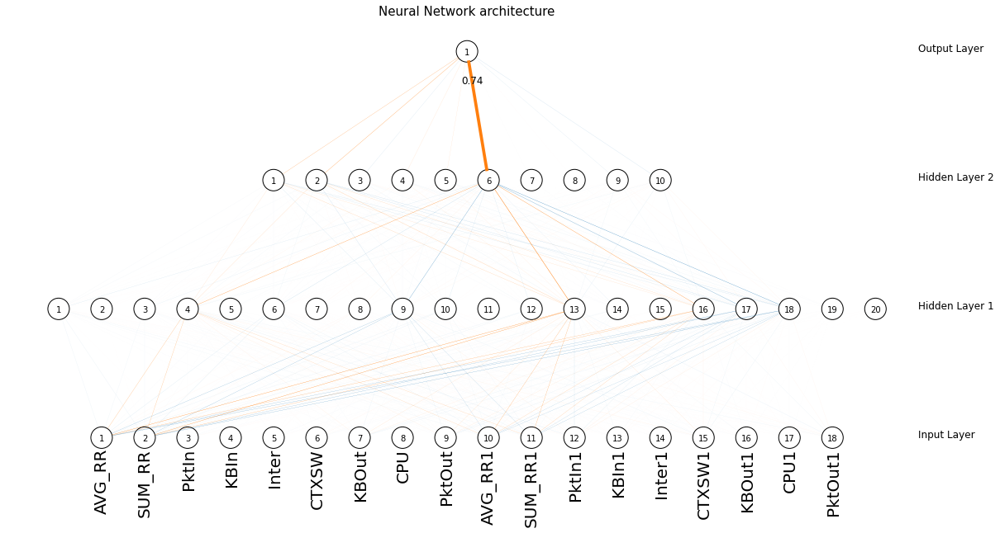

In [ ]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [ ]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']


X = ba[columns].values
y = ba['AVG_LAT_05']

errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[i-100:i,:]
  y_train = y_scaled[i-100:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(20,10),
                     max_iter=int(i*3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.099,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.09,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'hatodik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  -0.9999999999999921
step =  150 	 r2 =  0.9055215709109512
step =  200 	 r2 =  0.7645556849896056
step =  250 	 r2 =  0.7870927432972723
step =  300 	 r2 =  0.7658959006375845
step =  350 	 r2 =  0.7272607057379046
step =  400 	 r2 =  0.7270606921084937


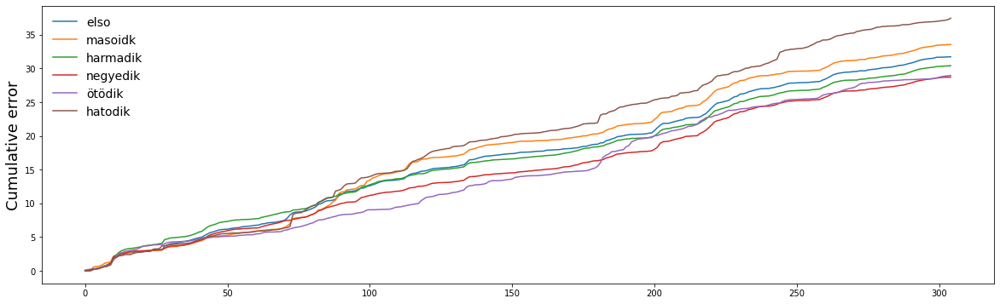

In [ ]:
playground_plots(playground_cumulative_errors)

[37.42798877]


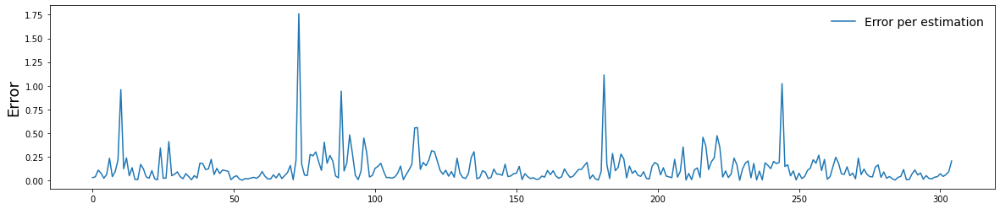

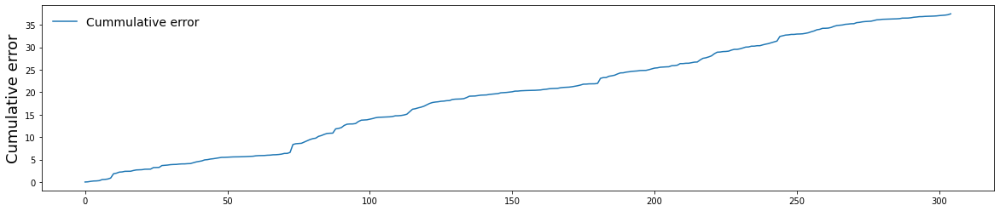

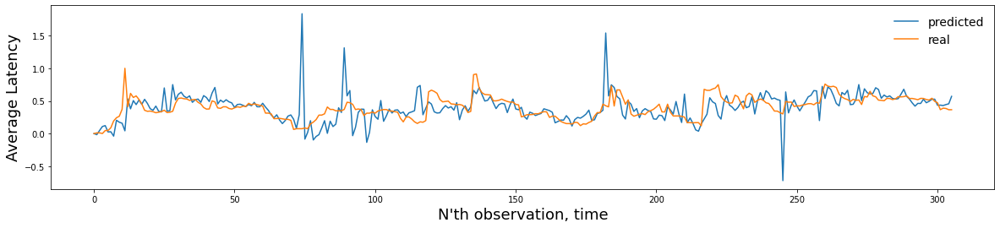

In [ ]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

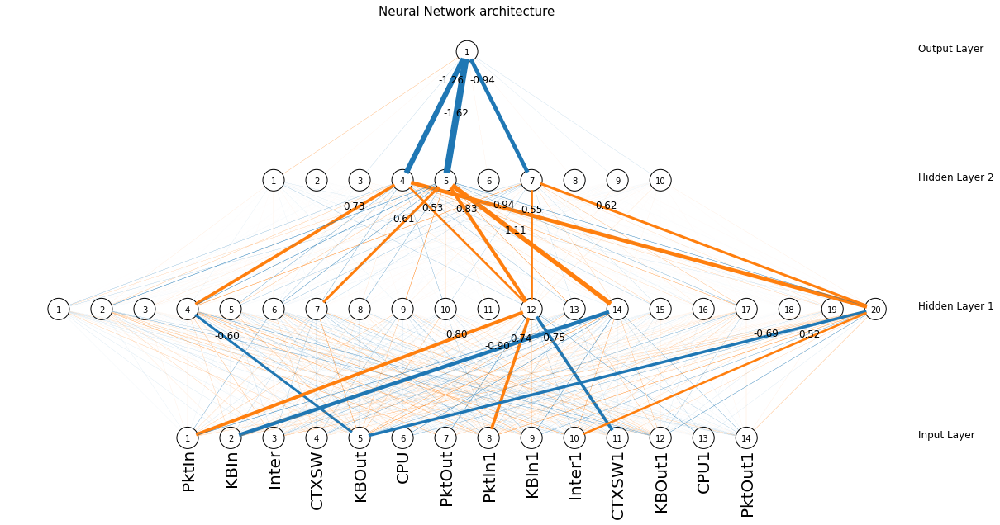

In [ ]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

# Playgroud end


<a name="sandbox"></a>

# SandBox

Itt lehet egy teljes neurális hálón elejétől a végéig végig menni. Ki lehet próbálni, hogy egy adott változóhozt tartozó érték mellett milyen értéket vesz fel a becslés.

[Vissza](#tartalom)<br>


In [ ]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']

columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1', 'AVG_RR1', 'SUM_RR1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler_X = preprocessing.MinMaxScaler()
min_max_scaler_y = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler_X.fit_transform(X)
y_scaled = min_max_scaler_y.fit_transform(y.values.reshape(-1, 1))

X_ = X_scaled
y_ = y_scaled

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(6, 4),
                           max_iter=3000,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_, y_)

print('')

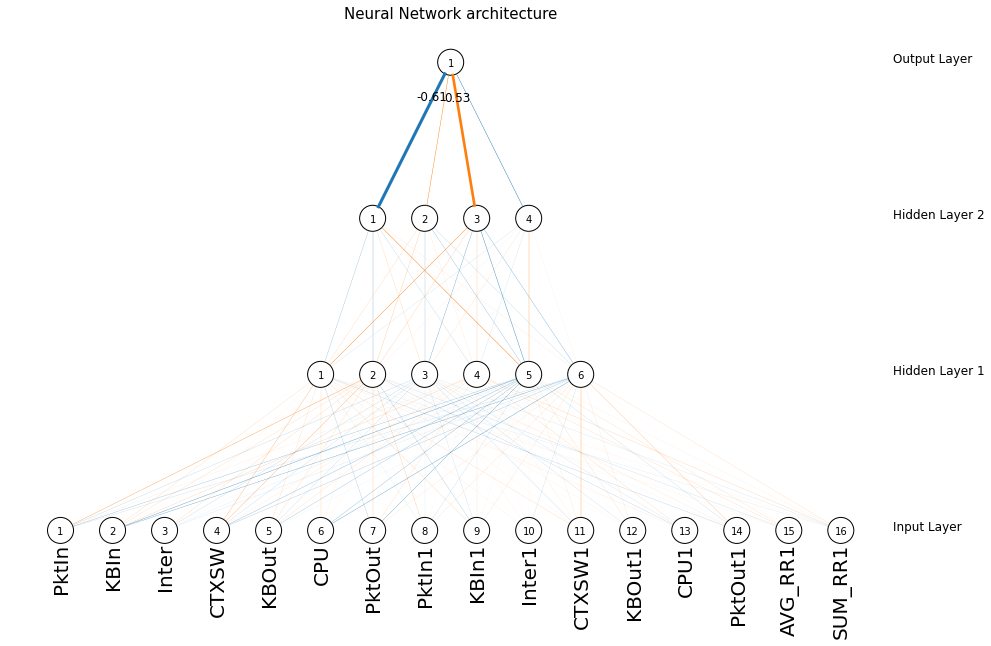

In [ ]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

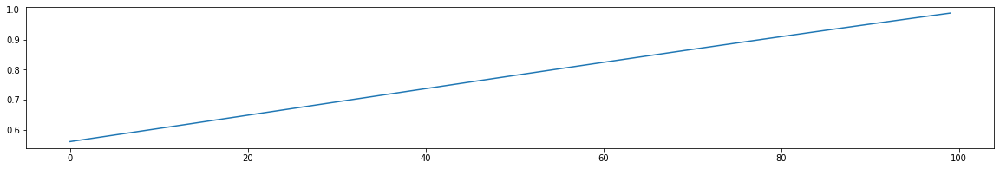

In [ ]:
time = 300

tf = ba[columns]
input = tf.iloc[time]

x_array = np.arange(0, 100, 1)

predictions = []
for i in x_array:
  input['CPU'] = i
  X = min_max_scaler_X.transform([input])
  pred = mlp.predict(X)
  predictions.append(pred)

plt.figure(figsize=(20, 3))
plt.plot(predictions)
plt.show()

In [ ]:
ido = 40
cpu = 100
matrix = np.zeros((ido, cpu))
for i in range(ido):
  input = tf.iloc[i]
  for j in range(cpu):
    input['CPU'] = j
    X = min_max_scaler_X.transform([input])
    pred = mlp.predict(X)
    matrix[i, j] = pred
    

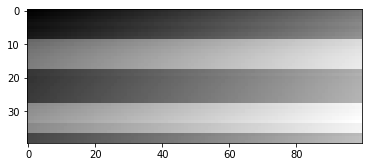

In [ ]:
plt.imshow(matrix, cmap='gray'); plt.show()

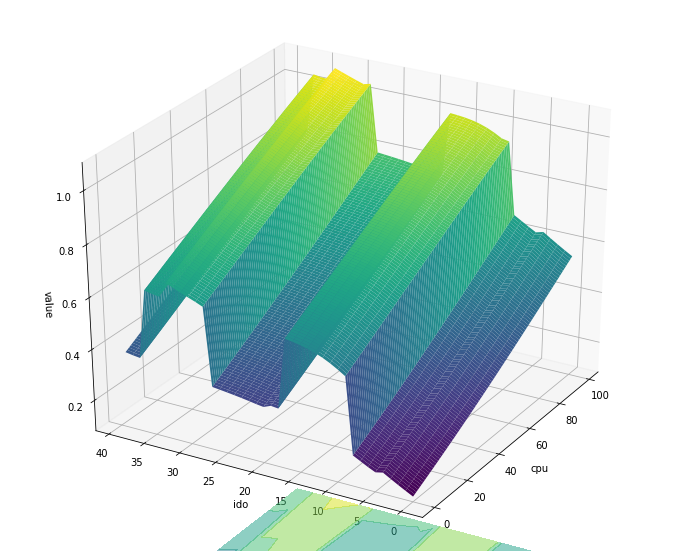

In [ ]:
# Ha a mátrixot már korábban kiszámoltuk

ido_space = np.linspace(0, ido-1, ido)
cpu_space = np.linspace(0, cpu-1, cpu)

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

z = matrix

# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = -0.7, cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

-----------------------------
40
100
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.
 36. 37. 38. 39.]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.
 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53.
 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 71.
 72. 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88. 89.
 90. 91. 92. 93. 94. 95. 96. 97. 98. 99.]
-----------------------------


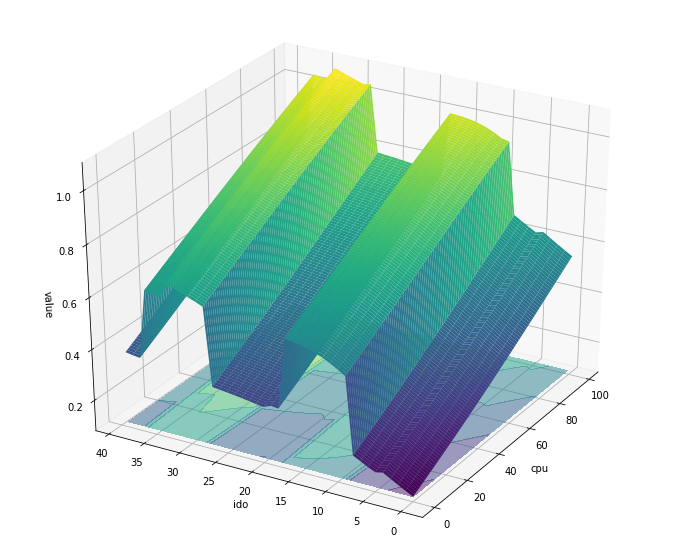

In [ ]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 40
cpu = 100

ido_space = np.linspace(0, ido-1, ido)
cpu_space = np.linspace(0, cpu-1, cpu)

print('-----------------------------')
print(ido_space.size)
print(cpu_space.size)
print(ido_space)
print(cpu_space)
print('-----------------------------')

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

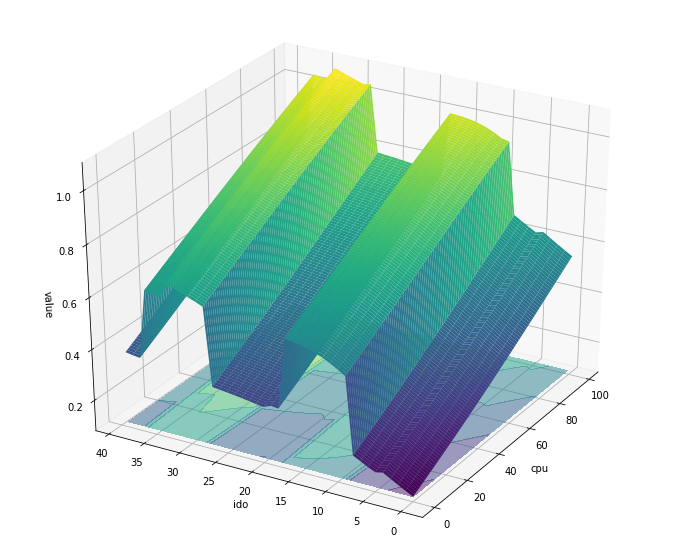

In [ ]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 40
cpu = 100
part_ido = 40   # hány részre bontsuk az időt? Ha annyi mint az idő, akkor 1-es lépésközökkel haladunk
part_cpu = 100  # hány részre bontsuk a cput?  Ha annyi mint a  cpu, akkor 1-es lépésközökkel haladunk

ido_space = np.linspace(0, ido-1, part_ido)
cpu_space = np.linspace(0, cpu-1, part_cpu)

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

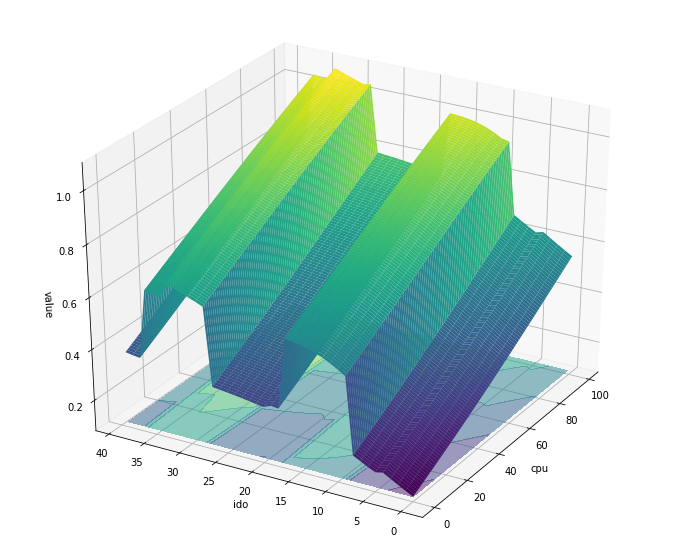

In [ ]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 40
cpu = 100
ido_step = 1   # mekkora lépésekben akarunk haladni
cpu_step = 1   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
cpu_space = np.arange(0, cpu, cpu_step, dtype='float64')

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [ ]:
a = 10
b = 20

a = b + a

b = a - b

a = a - b

print(a, ', ', b)

20 ,  10


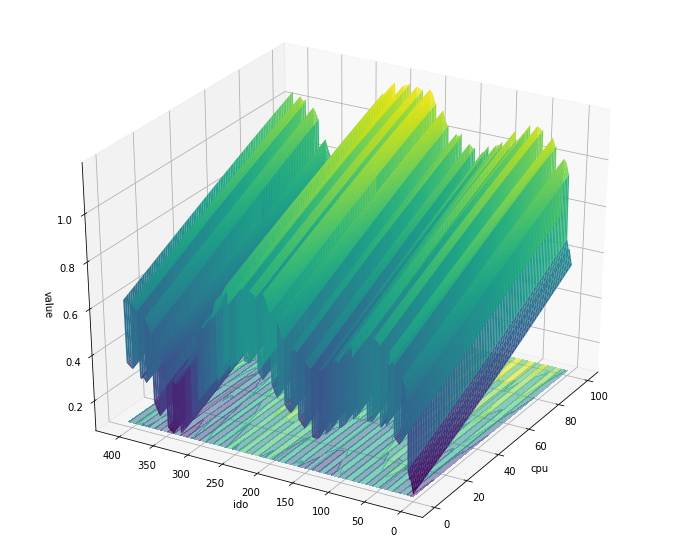

In [ ]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
cpu = 101
ido_step = 1   # mekkora lépésekben akarunk haladni
cpu_step = 1   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
cpu_space = np.arange(0, cpu, cpu_step, dtype='float64')


x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)


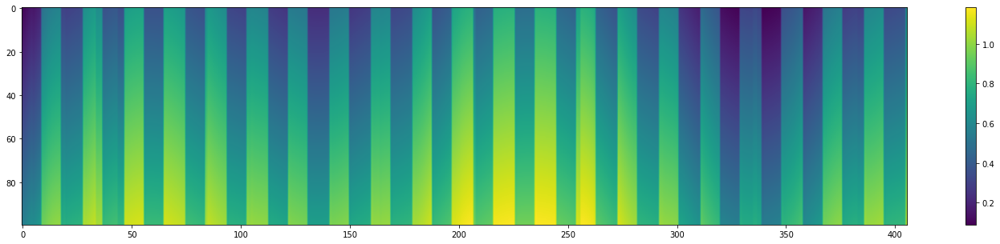

In [ ]:

tf = ba[columns]

ido = 406
cpu = 100
cpu_space = np.arange(0, cpu, 1)
matrix = np.zeros((ido, cpu))
for i in range(ido):
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    matrix[i, j] = pred
    
plt.figure(figsize=(26, 5))
picture = plt.imshow(matrix.T)
plt.colorbar(picture)
plt.show()

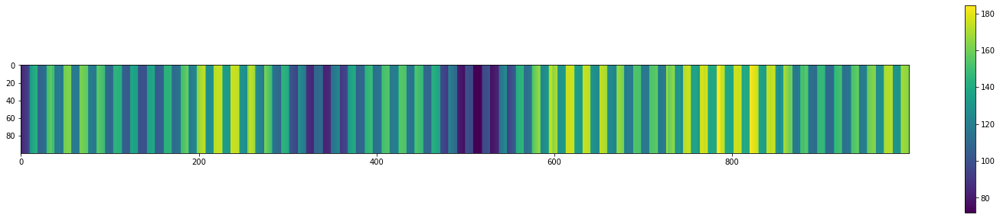

In [ ]:
tmp = df['AVG_LAT_05'].values; s = tmp.size; tmp = tmp.repeat(100).reshape(s, 100)
plt.figure(figsize=(26, 5)); picture = plt.imshow(tmp.T); plt.colorbar(picture); plt.show()

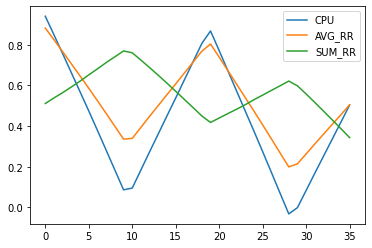

In [ ]:
xcov = [crosscorr(df['CPU'], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label='CPU')
xcov = [crosscorr(df['AVG_RR'], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label='AVG_RR')
xcov = [crosscorr(df['SUM_RR'], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label='SUM_RR')
plt.legend(); plt.show()

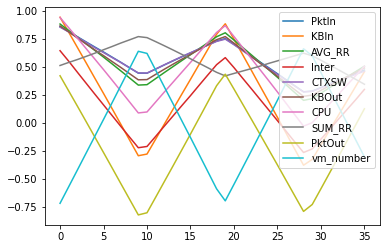

In [ ]:
for j in df.columns:
  if( j != 'timestamp' and j != 'AVG_LAT_05'):
    xcov = [crosscorr(df[j], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label=j)
plt.legend(loc=1); plt.show()

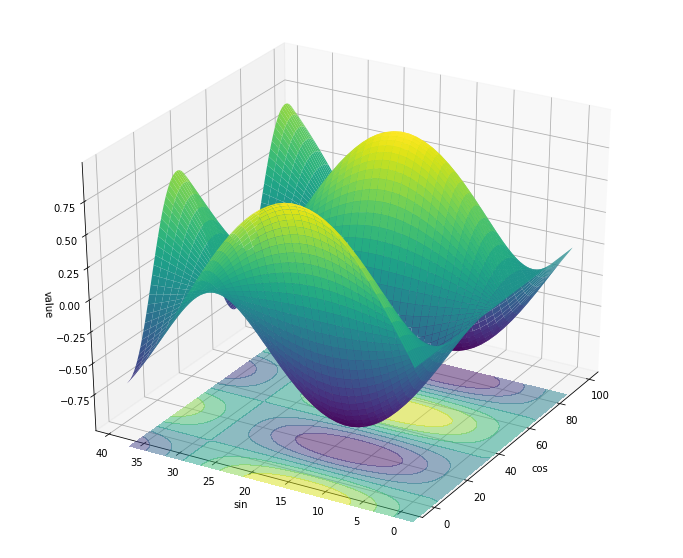

In [ ]:
# Fun(i)

ido = 40
cpu = 100

ido_space = np.linspace(0, ido-1, ido)
cpu_space = np.linspace(0, cpu-1, cpu)

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j in range(len(cpu_space)):
    j = int(j)
    z[i, j] = np.sin(i/10)*np.cos(j/10)

# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cos')
ax.set_ylabel('sin')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = -1.2, cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [ ]:
surface = go.Surface(x = x, y = y, z = z)
data = [surface]

fig = go.Figure(data = data)

fig.update_layout(title = '', autosize=False,
                  width = 700, height = 500,
                  scene = dict(
                    xaxis_title = 'cos',
                    yaxis_title = 'sin',
                    zaxis_title = 'v'),
                  margin = dict(l = 65, r = 50, b = 65, t = 60))

fig.show()

In [ ]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
cpu = 101
ido_step = 1   # mekkora lépésekben akarunk haladni
cpu_step = 1   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
cpu_space = np.arange(0, cpu, cpu_step, dtype='float64')


x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


In [ ]:
surface = go.Surface(x = x, y = y, z = z)
data = [surface]

fig = go.Figure(data = data)

fig.update_layout(title = '', autosize=False,
                  width = 700, height = 500,
                  scene = dict(
                    xaxis_title = 'cos',
                    yaxis_title = 'sin',
                    zaxis_title = 'v'),
                  margin = dict(l = 65, r = 50, b = 65, t = 60))

fig.show()

In [ ]:
tf.describe()

,PktIn,KBIn,Inter,CTXSW,KBOut,CPU,PktOut,PktIn1,KBIn1,Inter1,CTXSW1,KBOut1,CPU1,PktOut1,AVG_RR1,SUM_RR1
count,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
mean,137.162466,41.869385,17.365804,53.695150,14.634347,49.847703,39.255710,137.124808,41.839767,17.354456,53.641582,14.620194,13.784223,39.244514,18.007102,39.152446
std,13.071930,11.398902,5.727330,17.710018,5.716436,42.179424,9.535311,13.101293,11.401157,5.731568,17.744372,5.725107,8.961439,9.532541,9.672205,14.480990
min,94.083818,25.712236,9.523932,5.264853,1.373160,0.647059,24.279249,94.083818,25.712236,9.523932,5.264853,1.373160,0.647059,24.279249,1.100000,4.531429
25%,131.779705,31.891985,13.848600,43.533791,11.354329,11.574515,29.883505,131.746809,31.881085,13.802041,43.482254,11.340888,7.038717,29.883505,11.294305,31.217796
50%,140.281696,38.755827,16.383951,58.383918,15.227487,25.283609,36.372301,140.280546,38.746887,16.376512,58.381688,15.226905,11.666881,36.365030,17.135728,39.797870
75%,144.899701,52.853295,20.044615,66.884783,17.702897,100.000000,48.058230,144.887317,52.821479,20.005194,66.855552,17.695869,18.914062,48.058230,23.338502,47.196163
max,170.082925,62.589240,28.571066,77.682030,37.609325,100.000000,55.855447,170.082925,62.589240,28.571066,77.682030,37.609325,40.601463,55.855447,46.014991,82.740515


In [ ]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
ido_step = 1   # mekkora lépésekben akarunk haladni
ctx_step = 100   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
ctx_space = np.arange(1000, 4000, ctx_step, dtype='float64')

print(ctx_space)

x, y = np.meshgrid(ctx_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(ctx_space):
    j = int(j)
    input['CTXSW'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


[1000. 1100. 1200. 1300. 1400. 1500. 1600. 1700. 1800. 1900. 2000. 2100.
 2200. 2300. 2400. 2500. 2600. 2700. 2800. 2900. 3000. 3100. 3200. 3300.
 3400. 3500. 3600. 3700. 3800. 3900.]


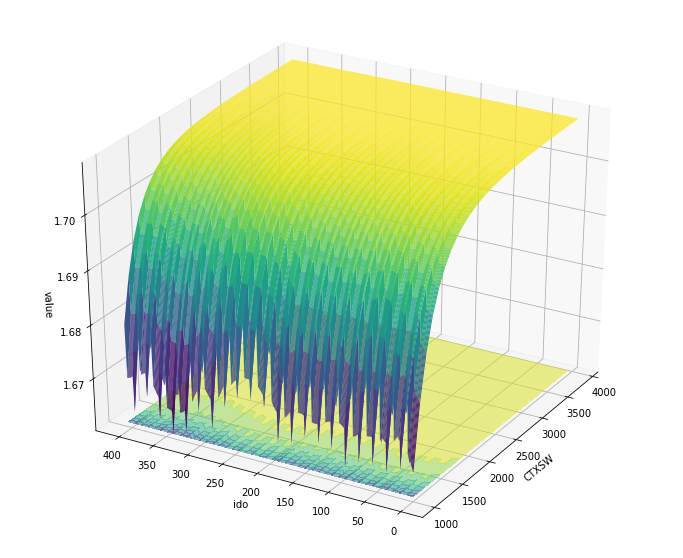

In [ ]:
# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('CTXSW')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [ ]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
ido_step = 1   # mekkora lépésekben akarunk haladni
ctx_step = 0.01   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
ctx_space = np.arange(0, 0.8, ctx_step, dtype='float64')

print(ctx_space)

x, y = np.meshgrid(ctx_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(ctx_space):
    j = int(j)
    input['KBOut1'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


[0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27
 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41
 0.42 0.43 0.44 0.45 0.46 0.47 0.48 0.49 0.5  0.51 0.52 0.53 0.54 0.55
 0.56 0.57 0.58 0.59 0.6  0.61 0.62 0.63 0.64 0.65 0.66 0.67 0.68 0.69
 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79]


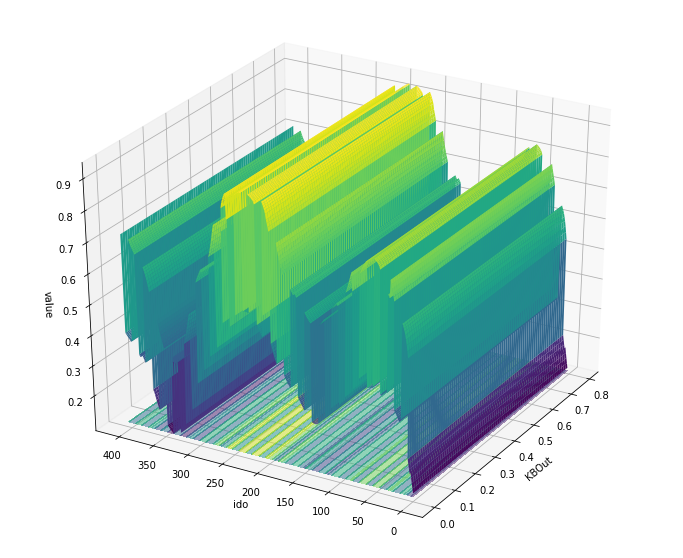

In [ ]:
# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('KBOut')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [ ]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
ido_step = 1   # mekkora lépésekben akarunk haladni
ctx_step = 0.005   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
ctx_space = np.arange(0, 0.3, ctx_step, dtype='float64')

print(ctx_space)

x, y = np.meshgrid(ctx_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(ctx_space):
    j = int(j)
    input['SUM_RR1'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


[0.    0.005 0.01  0.015 0.02  0.025 0.03  0.035 0.04  0.045 0.05  0.055
 0.06  0.065 0.07  0.075 0.08  0.085 0.09  0.095 0.1   0.105 0.11  0.115
 0.12  0.125 0.13  0.135 0.14  0.145 0.15  0.155 0.16  0.165 0.17  0.175
 0.18  0.185 0.19  0.195 0.2   0.205 0.21  0.215 0.22  0.225 0.23  0.235
 0.24  0.245 0.25  0.255 0.26  0.265 0.27  0.275 0.28  0.285 0.29  0.295]


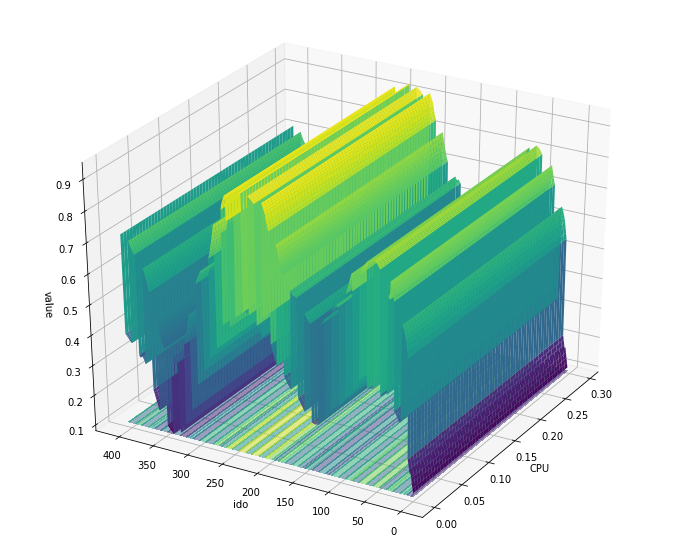

In [ ]:
# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('CPU')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

# Sandbox end

[SandBox](#sandbox)<br>
[Vissza](#tartalom)<br>

In [ ]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

In [ ]:
X = df.values

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)

h = np.zeros((1, df.shape[0]))

for i, v in enumerate(df.columns):
  if( v != 'timestamp'):
    col = X_scaled[:,i]
    size = col.size
    col = col.reshape((1, col.size))
    col = col.T
    col = col.repeat(10, axis=0)
    col = col.reshape((size, 10))
    h = np.concatenate((h, col.T), axis=0)

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')


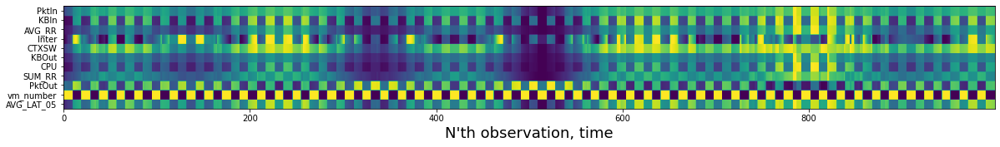

In [ ]:
print(df.columns)
labels = df.columns[1:]
y = np.arange(5, 115, 10)
plt.figure(figsize=(20, 7)); plt.imshow(h); plt.yticks(y, labels, rotation='horizontal'); plt.xlabel('N\'th observation, time', fontsize=18); plt.show()

<a name="beforeafter"></a>

# Before After experiment

Alaposan átnézni azt a képletet amit a prezentációban is bemutatok és ami a korábbi cikk alalpja.
<br>
Ugyanis van egy olyan sejtésem, hogy nem pontosan értem, illetve az én eseteemben a `delta_vm` mindíg 1
mivel mindíg egyesével skálázok. Ezért ezt a képletet alaposan tanulmányozni kell. Különösen azt, hogy ennek a képletnek az alapján én magam, hogyan határoztam meg az optimizerben azokat az eseteket amikor 1-nél több géppel skáláz. Ha jól emlékszem, minden egyes scenárióra kiszámoltuk a becslést
még az adott változón belül is. Tehát külön egyenlet volt arra, hogy mi lesz az CPU' 1,2,3-1,-2,-3 gép esetén. Alaposan át kell néznem ezt a képletet.
<br>
Vizualizálni és megérteni benne minden részletet.

Tulajdonképpen én egy olyan képlettel becsülök ahol:

$$metric_{after} = \alpha + \beta_1 * metric_{before} + \beta_2 * vm\_number + \beta_3 * deltaVM$$

A fenti képletet átírom másként is, hogy könnyebben érthető legyen:

$$m' = w_0 + w_1*m + w_2*vm + w_3*\Delta vm$$

Ebben aképletben az a jó, hogy $\Delta vm$-hez tartozik a $w_3$ súly amit a lineáris modell a legkisebb négyzetek módszerével becsül.
<br>
Ha a tanulásnál a skálázást mindíg 1-es lépésközökkel végeztük, akkor modellünkben a tanulás során $\Delta vm$ mindíg 1 volt. Tehát a hozzá tartozó $w_3$ szorzótényező is mindíg $+1$ vagy $-1$ érték lehet, ezért ez alapján könnyű extrapollálni az értékeket $\Delta vm = n \in \mathbb  {Z}$ esetre.
<br>
Én ezt a képletet használom, holott a cikkben nem ez szerepel, hanem ez.

$$cpu' = w_0 + w_1 * cpu*vm/(vm+vm') + w_2 * vm'/(vm+vm')$$

Na és itt jön rögtön az első nagy kérdés mi a $vm'$, a az újonnan előálló Virtuális Gépek száma, vagy a hozzáadott Virtuális Gépek száma, azaz $\Delta vm$.

Ezt a kérdést jó lenne tisztázni $vm' = \Delta vm$ vagy $vm' \neq \Delta vm$.


Mi a kettő között a különbség. Egy példán keresztül:

Ha vm' az újonan előállított gépek száma (ekkor 5 gépünk volt 1-et adtunk hozzá)

> $w_1*5/(5+6) + w_2*6/(5+6) = w_1 * \frac{5}{11} + w_2 * \frac{6}{11} $

Ha például itt 2 új gépet adnánk hozzá akkor a képlet így nézne ki.

> $w_1*5/(5+7) + w_2*7/(5+7) = w_1 * \frac{5}{12} + w_2 * \frac{7}{12} $

Van egy másik lehetőség is ebben a képletben. Mi van ha $vm'$ mégis a $\Delta vm$ a képletben. Ekkor így nézne ki egy plusz vm esetén:

> $w_1*5/(5+1) + w_2*1/(5+1) = w_1 * \frac{5}{6} + w_2 * \frac{1}{6} $

Két új vm esetén pedig így nézne ki

> $w_1*5/(5+2) + w_2*2/(5+2) = w_1 * \frac{5}{7} + w_2 * \frac{2}{7} $

---

A lényeg, hogy mindhárom verziót ki kell próbalnom és elemeznem.






[vissza a tartalomhoz](#tartalom)

In [ ]:
# Mivel az adataink között csak olyan adatok vannak ahol egy egységgel változott a gépek száma ezért megtehetjük a következőt

In [ ]:
fd.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051', 'difference',
       'abs_difference'],
      dtype='object')

timestamp
r2_old =  1.0
r2_vm1 =  1.0
r2_dif =  1.0
r2_ref =  1.0
r2_met =  0.2325219729689436
r2_mvm =  0.23375552846324565
r2_mdf =  0.23375552846324
r2_all =  0.2337555284632422
r2_x_1 =  0.23375552846324


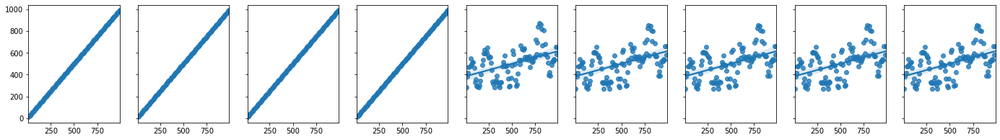

PktIn
r2_old =  0.6563866651333199
r2_vm1 =  0.9405166756643512
r2_dif =  0.9405166756643512
r2_ref =  0.9405166756643512
r2_met =  0.9782694400201363
r2_mvm =  0.9799498338391268
r2_mdf =  0.9799498338391268
r2_all =  0.9799498338391267
r2_x_1 =  0.9799498338391268


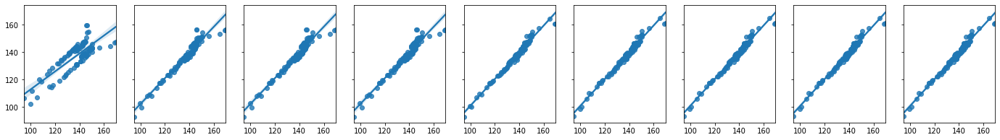

KBIn
r2_old =  0.40229995091629767
r2_vm1 =  0.9343375583195211
r2_dif =  0.934337558319521
r2_ref =  0.934337558319521
r2_met =  0.9975903620421204
r2_mvm =  0.997890254279125
r2_mdf =  0.997890254279125
r2_all =  0.997890254279125
r2_x_1 =  0.997890254279125


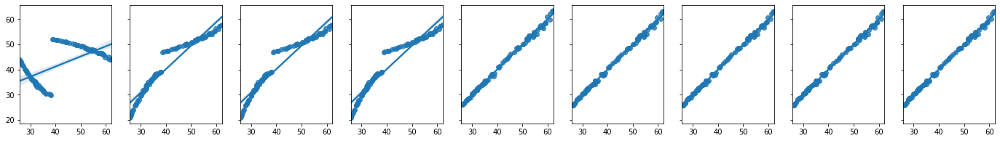

AVG_RR
r2_old =  0.4261860739342148
r2_vm1 =  0.8723202066133597
r2_dif =  0.8723202066133597
r2_ref =  0.8723202066133597
r2_met =  0.9994578051958145
r2_mvm =  0.9994578452398408
r2_mdf =  0.9994578452398408
r2_all =  0.9994578452398408
r2_x_1 =  0.9994578452398408


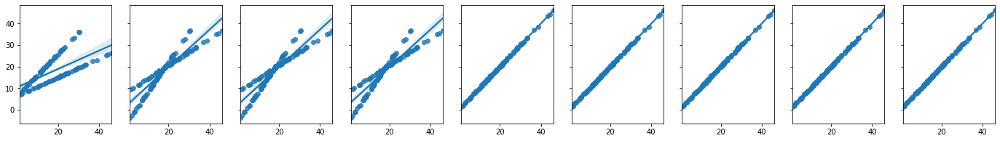

Inter
r2_old =  5.466651775698494e-07
r2_vm1 =  0.54300548296391
r2_dif =  0.5430054829639102
r2_ref =  0.5430054829639099
r2_met =  0.6200328022912884
r2_mvm =  0.620481230195839
r2_mdf =  0.620481230195838
r2_all =  0.6204812301958388
r2_x_1 =  0.620481230195838


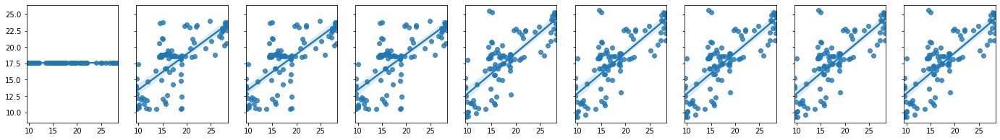

CTXSW
r2_old =  0.6468127897840992
r2_vm1 =  0.907965464426184
r2_dif =  0.907965464426184
r2_ref =  0.9079654644261841
r2_met =  0.9779611868782002
r2_mvm =  0.9788701012693707
r2_mdf =  0.9788701012693711
r2_all =  0.9788701012693709
r2_x_1 =  0.9788701012693711


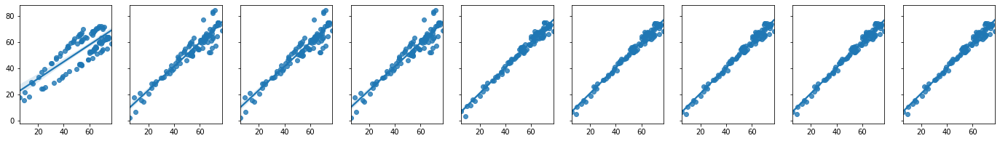

KBOut
r2_old =  0.45668479592950506
r2_vm1 =  0.7882344260513253
r2_dif =  0.7882344260513254
r2_ref =  0.7882344260513253
r2_met =  0.9422563233083426
r2_mvm =  0.9453732104827038
r2_mdf =  0.9453732104827028
r2_all =  0.9453732104827032
r2_x_1 =  0.9453732104827028


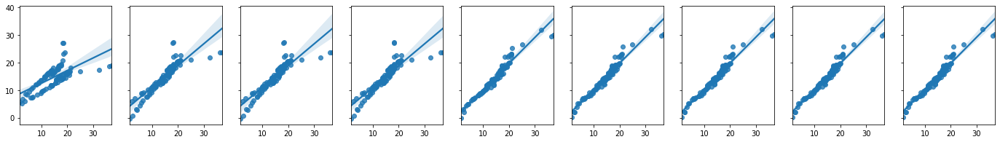

CPU
r2_old =  0.015842733316079993
r2_vm1 =  0.7086003213852908
r2_dif =  0.7086003213852909
r2_ref =  0.7086003213852908
r2_met =  0.9995908999845416
r2_mvm =  0.9995909029536911
r2_mdf =  0.9995909029536911
r2_all =  0.9995909029536911
r2_x_1 =  0.9995909029536911


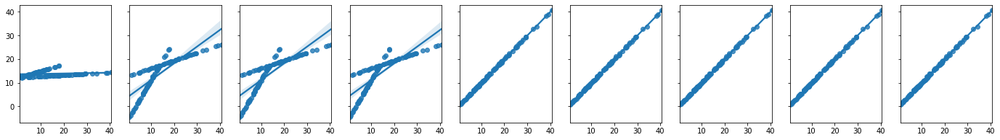

SUM_RR
r2_old =  0.7163885815761093
r2_vm1 =  0.8564059722026106
r2_dif =  0.8564059722026107
r2_ref =  0.8564059722026107
r2_met =  0.9517057239878046
r2_mvm =  0.9535161346056209
r2_mdf =  0.9535161346056208
r2_all =  0.9535161346056209
r2_x_1 =  0.9535161346056208


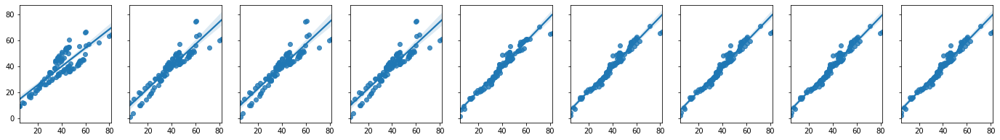

PktOut
r2_old =  0.5130059383084598
r2_vm1 =  0.9512743941508266
r2_dif =  0.9512743941508266
r2_ref =  0.9512743941508266
r2_met =  0.9853515410801831
r2_mvm =  0.98606514924333
r2_mdf =  0.9860651492433299
r2_all =  0.9860651492433296
r2_x_1 =  0.9860651492433299


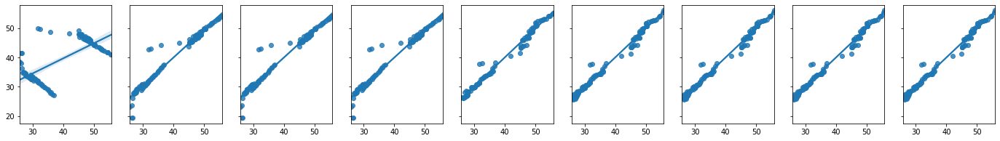

vm_number
r2_old =  1.0
r2_vm1 =  1.0
r2_dif =  1.0
r2_ref =  1.0
r2_met =  0.9999965108362746
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


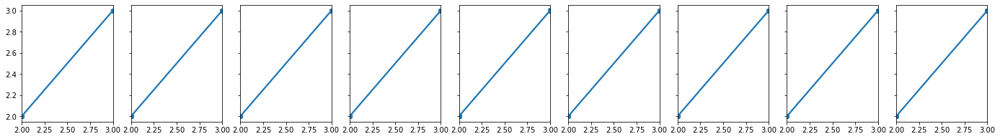

AVG_LAT_05
r2_old =  0.001230085309190443
r2_vm1 =  0.9649791628644919
r2_dif =  0.9649791628644919
r2_ref =  0.9649791628644919
r2_met =  0.9917204366064072
r2_mvm =  0.9917346031141936
r2_mdf =  0.9917346031141937
r2_all =  0.9917346031141938
r2_x_1 =  0.9917346031141937


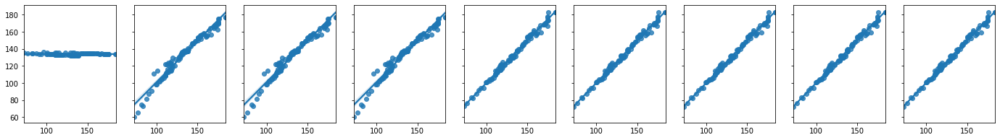

In [ ]:
# Felskálázás

regression_x_all_results = []
regression_x_ref_results = []

for i in df.columns:
  print(i)
  y     = fd[i].values
  x_old = fd[[str( i + '1' )]]
  x_vm1 = fd[[str( i + '1'), 'vm_number1']]
  x_dif = fd[[str( i + '1'), 'difference']]
  x_ref = fd[[str( i + '1'), 'vm_number1', 'difference']] # referencia
  x_met = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1']]
  x_mvm = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1']]
  x_mdf = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'difference']]
  x_all = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference']]
  x_x_1 = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'difference']]
  x_x_2 = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference']]
  x_x_3 = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference', 'AVG_LAT_051']]

  # vm_number, AVG_LAT_051, difference (vm_number1, AVG_LAT_051 voltak eddig az allban benne, ami hiányzott az a diff)


  # meggondolás az, hogy ennek függetlennek kéne lennie a vm-ek számától, de egyébként meg ez sem feltétlenül igaz
  # mert 10 gépnél hozzáadok 1 vm-et akkor 10%-al növelem, ha 1-gépnél adok hozzá egyet akkor meg 50%-al

  regression = LinearRegression()

  # old
  regression_old = LinearRegression()
  model_old = regression_old.fit(x_old, y)
  y_pred_old = model_old.predict(x_old)
  r2_old  = r2_score(y, y_pred_old)

  print('r2_old = ', r2_old)

  # vm1
  regression_vm1 = LinearRegression()
  model_vm1 = regression_vm1.fit(x_vm1, y)
  y_pred_vm1 = model_vm1.predict(x_vm1)
  r2_vm1 = r2_score(y, y_pred_vm1)

  print('r2_vm1 = ', r2_vm1)

  # dif
  regression_dif = LinearRegression()
  model_dif = regression_dif.fit(x_dif, y)
  y_pred_dif = model_dif.predict(x_dif)
  r2_dif = r2_score(y, y_pred_dif)

  print('r2_dif = ', r2_dif)

  # x_ref
  regression_ref = LinearRegression()
  model_ref = regression_ref.fit(x_ref, y)
  y_pred_ref = model_ref.predict(x_ref)
  r2_ref = r2_score(y, y_pred_ref)

  print('r2_ref = ', r2_ref)
  regression_x_ref_results.append(['model_ref', str(i), x_ref, model_ref])

  # x_met
  regression_met = LinearRegression()
  model_met = regression_met.fit(x_met, y)
  y_pred_met = model_met.predict(x_met)
  r2_met = r2_score(y, y_pred_met)

  print('r2_met = ', r2_met)

  # x_mvm
  regression_mvm = LinearRegression()
  model_mvm = regression_mvm.fit(x_mvm, y)
  y_pred_mvm = model_mvm.predict(x_mvm)
  r2_mvm = r2_score(y, y_pred_mvm)

  print('r2_mvm = ', r2_mvm)

  # x_mdf
  regression_mdf = LinearRegression()
  model_mdf = regression_mdf.fit(x_mdf, y)
  y_pred_mdf = model_mdf.predict(x_mdf)
  r2_mdf = r2_score(y, y_pred_mdf)

  print('r2_mdf = ', r2_mdf)

  # x_all
  regression_all = LinearRegression()
  model_all = regression_all.fit(x_all, y)
  y_pred_all = model_all.predict(x_all)
  r2_all = r2_score(y, y_pred_all)

  print('r2_all = ', r2_all)
  regression_x_all_results.append(['model_all', str(i), x_all, model_all])

  # x_x_1
  regression_x_1 = LinearRegression()
  model_x_1 = regression_x_1.fit(x_x_1, y)
  y_pred_x_1 = model_x_1.predict(x_x_1)
  r2_x_1 = r2_score(y, y_pred_x_1)

  print('r2_x_1 = ', r2_x_1)


  fig, axes = plt.subplots(1, 9, figsize=(24, 3), sharey=True)
  sns.regplot(ax=axes[0], x = y, y = y_pred_old)
  sns.regplot(ax=axes[1], x = y, y = y_pred_vm1)
  sns.regplot(ax=axes[2], x = y, y = y_pred_dif)
  sns.regplot(ax=axes[3], x = y, y = y_pred_ref)
  sns.regplot(ax=axes[4], x = y, y = y_pred_met)
  sns.regplot(ax=axes[5], x = y, y = y_pred_mvm)
  sns.regplot(ax=axes[6], x = y, y = y_pred_mdf)
  sns.regplot(ax=axes[7], x = y, y = y_pred_all)
  sns.regplot(ax=axes[8], x = y, y = y_pred_x_1)
  plt.show()



In [ ]:
print(regression_x_all_results[0][2].columns)
print(regression_x_all_results[1][2].columns)

print('')
print(regression_x_ref_results[0][2].columns)
print(regression_x_ref_results[1][2].columns)
print(regression_x_ref_results[2][2].columns)

Index(['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'difference'],
      dtype='object')
Index(['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'difference'],
      dtype='object')

Index(['timestamp1', 'vm_number1', 'difference'], dtype='object')
Index(['PktIn1', 'vm_number1', 'difference'], dtype='object')
Index(['KBIn1', 'vm_number1', 'difference'], dtype='object')


In [ ]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'vm_number']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler_X = preprocessing.MinMaxScaler()
min_max_scaler_y = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler_X.fit_transform(X)
y_scaled = min_max_scaler_y.fit_transform(y.values.reshape(-1, 1))

X_ = X_scaled
y_ = y_scaled

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10, 4),
                           max_iter=3000,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_, y_)

print('')

In [ ]:
# skálázás x_all alapján

new_vm = 1

scaled_df = fd.copy()
scaled_df = df.copy()
scaled_df = scaled_df.drop(scaled_df.tail(1).index,inplace=False)
scaled_ba = ba.copy()

scaled_ba['difference'] = new_vm

for j in range(len(regression_x_all_results)):

  model_name            = regression_x_all_results[j][0]
  model_input_variable  = regression_x_all_results[j][1]
  model_fd              = regression_x_all_results[j][2]
  model_columns         = regression_x_all_results[j][2].columns
  model_regression      = regression_x_all_results[j][3]
  model_regression_coef = regression_x_all_results[j][3].coef_

  # vegyen egy értéket a df-ből
  # cserélje ki benne a difference értéket valami másra
  # csinálja meg rajta  predikciót
  # tegye el egy változóba
  # ezt az értéket tegye be a scaled_df megfelelő oszlopába

  # scaled_ba = scaled_ba[model_columns]
  tmp = scaled_ba[model_columns]

  # new_input_variable = model_regression.predict(scaled_ba)
  new_input_variable = model_regression.predict(tmp)

  # 0.

  # Nos bár a becslést megcsinálhatja a 'vm_number' az 'AVG_RR' és a 'SUM_RR' és az 'AVG_LAT_05' és a 'timestamp'
  # változókra is, jobb lenne, ha ezeket nem tennénk be az új értékek közé
  # hanem a mért értékekkel számolnánk a becsült helyett

  if ( model_input_variable == 'AVG_RR' ):
    _null = 0
  elif( model_input_variable == 'SUM_RR'):
    _null = 0
  elif( model_input_variable == 'AVG_LAT_05'):
    _null = 0
  elif( model_input_variable == 'timestamp'):
    _null = 0
  elif( model_input_variable == 'vm_number'):
    scaled_df[model_input_variable] = scaled_df[model_input_variable] + new_vm
  else:
    scaled_df[model_input_variable] = new_input_variable


In [ ]:
# skálázás x_ref alapján

new_vm = -3

scaled_df = fd.copy()
scaled_df = df.copy()
scaled_df = scaled_df.drop(scaled_df.tail(1).index,inplace=False)
scaled_ba = ba.copy()

print(scaled_ba.columns)

scaled_ba['difference'] = new_vm

for j in range(len(regression_x_ref_results)):

  model_name            = regression_x_ref_results[j][0]
  model_input_variable  = regression_x_ref_results[j][1]
  model_fd              = regression_x_ref_results[j][2]
  model_columns         = regression_x_ref_results[j][2].columns
  model_regression      = regression_x_ref_results[j][3]
  model_regression_coef = regression_x_ref_results[j][3].coef_

  # vegyen egy értéket a df-ből
  # cserélje ki benne a difference értéket valami másra
  # csinálja meg rajta  predikciót
  # tegye el egy változóba
  # ezt az értéket tegye be a scaled_df megfelelő oszlopába

  # scaled_ba = scaled_ba[model_columns]
  tmp = scaled_ba[model_columns]

  # new_input_variable = model_regression.predict(scaled_ba)
  new_input_variable = model_regression.predict(tmp)

  # 0.

  # Nos bár a becslést megcsinálhatja a 'vm_number' az 'AVG_RR' és a 'SUM_RR' és az 'AVG_LAT_05' és a 'timestamp'
  # változókra is, jobb lenne, ha ezeket nem tennénk be az új értékek közé
  # hanem a mért értékekkel számolnánk a becsült helyett

  if ( model_input_variable == 'AVG_RR' ):
    _null = 0
  elif( model_input_variable == 'SUM_RR'):
    _null = 0
  elif( model_input_variable == 'AVG_LAT_05'):
    _null = 0
  elif( model_input_variable == 'timestamp'):
    _null = 0
  elif( model_input_variable == 'vm_number'):
    scaled_df[model_input_variable] = scaled_df[model_input_variable] + new_vm
  else:
    scaled_df[model_input_variable] = new_input_variable


Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')


In [ ]:
scaled_df.head()

,timestamp,PktIn,KBIn,AVG_RR,Inter,CTXSW,KBOut,CPU,SUM_RR,PktOut,vm_number,AVG_LAT_05
0,0,127.586938,76.993447,3.249656,27.084833,41.660728,14.231937,29.002488,13.386896,80.340911,0,82.463145
1,1,129.422656,77.092710,3.596558,27.204796,43.228891,14.635581,29.154777,14.815951,80.151837,0,84.199721
2,2,131.175064,77.200727,3.943180,27.446475,44.795793,15.038900,29.306943,16.243856,79.954184,0,85.989481
3,3,132.850018,77.317062,4.289245,27.811551,46.360173,15.441571,29.458865,17.669463,79.748860,0,87.835079
4,4,134.452697,77.441240,4.634474,28.291783,47.920775,15.843269,29.610420,19.091628,79.536693,0,89.731962


In [ ]:
df.head()

,timestamp,PktIn,KBIn,AVG_RR,Inter,CTXSW,KBOut,CPU,SUM_RR,PktOut,vm_number,AVG_LAT_05
0,0,108.139906,26.193229,3.249656,9.554430,15.553601,4.056635,1.911562,13.386896,36.014849,3,82.463145
1,1,110.008204,26.312156,3.596558,9.763793,17.213952,4.489682,2.115622,14.815951,35.809488,3,84.199721
2,2,111.791715,26.441571,3.943180,10.185578,18.872967,4.922381,2.319518,16.243856,35.594808,3,85.989481
3,3,113.496396,26.580951,4.289245,10.822717,20.529313,5.354383,2.523086,17.669463,35.371796,3,87.835079
4,4,115.127518,26.729728,4.634474,11.660831,22.181659,5.785342,2.726161,19.091628,35.141351,3,89.731962


-----------scaled_df------------
[129.42265568  77.09270998  27.20479565  43.22889093  14.63558102
  29.15477686  80.15183742   0.        ]
--------------df----------------
[110.00820411  26.31215623   9.76379273  17.21395183   4.489682
   2.11562228  35.8094878    3.        ]
--------------scaled_norm----------------
[ 0.46499017  1.39329306  0.92826896  0.52424079  0.36599957  0.71350628
  1.76945267 -2.        ]
--------------df_norm----------------
[0.20953386 0.01626815 0.01259302 0.16500366 0.08600584 0.03675598
 0.36515602 1.        ]


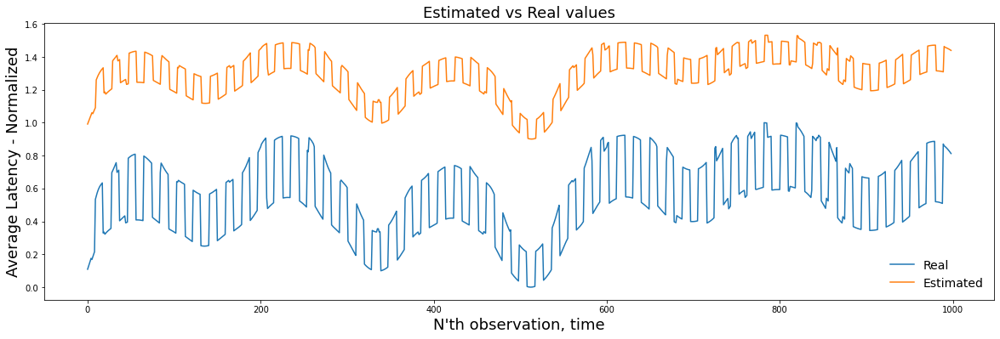

In [ ]:
# Most, hogy meg van a hipotetikus felskálázáshoz tartozó érték meg lehet nézni, hogy ilyen becslést ad a neurális háló

X = scaled_df[columns]
y = ba['AVG_LAT_05']



print('-----------scaled_df------------')
print(scaled_df[columns].values[1,:])
print('--------------df----------------')
print(df[columns].values[1,:])

# U!!!!!!! igazából amit itt elrontok, hogy nem a régi normalizációt használom, hanem újra normalizálom őket, pedig a régi értékekekn végrehajtott normalizáció
# szerint kéne eljárnom - nem a 'fit_transform(X)' hanem simán 'transform(X)' eljárást kell használnom

X_scaled = min_max_scaler_X.transform(X)
y_scaled = min_max_scaler_y.transform(y.values.reshape(-1, 1))

print('--------------scaled_norm----------------')
print(X_scaled[1,:])

print('--------------df_norm----------------')
df_normed = min_max_scaler_X.transform(df[columns])
print(df_normed[1,:])


scaled_y_pred = mlp.predict(X_scaled)

timeline_plot(y_scaled, scaled_y_pred)

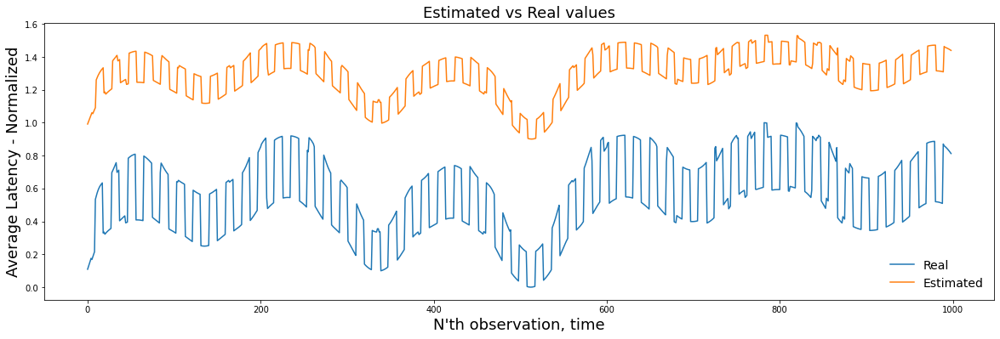

In [ ]:
X = scaled_df[columns];y = ba['AVG_LAT_05'];X_scaled = min_max_scaler_X.transform(X);y_scaled = min_max_scaler_y.transform(y.values.reshape(-1, 1))
df_normed = min_max_scaler_X.transform(df[columns]);scaled_y_pred = mlp.predict(X_scaled);timeline_plot(y_scaled, scaled_y_pred)

# Before After end

<a name="szintetikus_adatok"></a>

# Szintetikus adatok generálása

[vissza a tartalomhoz](#tartalom)

In [ ]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

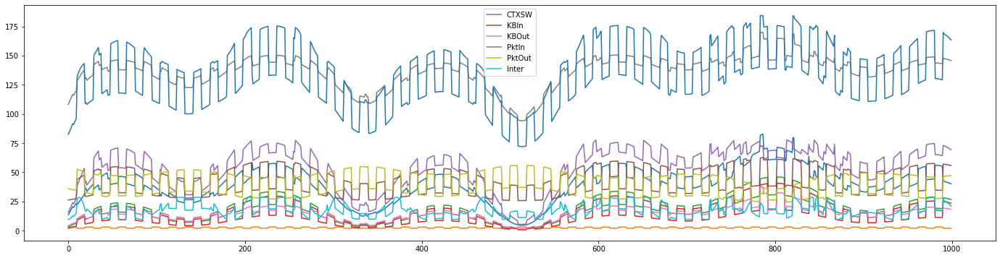

In [ ]:
time = np.arange(0, 1000, 1)

SUM_RR = 20 * (np.sin(time/100) + np.sin(time/30) + np.sin(time/360) + time/1000*1.2)
SUM_RR = SUM_RR + abs(np.min(SUM_RR)) + 3

vm_number = np.sin(time/3) + 3
vm_number = vm_number.astype(int)

AVG_RR = SUM_RR / vm_number * 1.1

CPU = AVG_RR * 1.8
CPU = CPU / (vm_number*1.02)

CTXSW = SUM_RR
CTXSW[AVG_RR < 50] = CTXSW * 1.2
CTXSW[AVG_RR < 45] = CTXSW[AVG_RR < 45] * 1.19
CTXSW[AVG_RR < 40] = CTXSW[AVG_RR < 40] * 1.18
CTXSW[AVG_RR < 35] = CTXSW[AVG_RR < 35] * 1.17
CTXSW[AVG_RR < 30] = CTXSW[AVG_RR < 30] * 1.16
CTXSW[AVG_RR < 25] = CTXSW[AVG_RR < 25] * 1.15
CTXSW[AVG_RR < 20] = CTXSW[AVG_RR < 20] * 1.14
CTXSW[AVG_RR < 15] = CTXSW[AVG_RR < 15] * 1.13
CTXSW[AVG_RR < 10] = CTXSW[AVG_RR < 10] * 1.12
CTXSW[AVG_RR < 5] = CTXSW[AVG_RR <  5] * 1.11
CTXSW = CTXSW / (vm_number*0.8)


KBIn = AVG_RR * CTXSW / 100
KBIn = KBIn + np.min(KBIn) + 10
KBIn = np.log(KBIn) * 40
KBIn = KBIn / (vm_number*1.2)

KBOut = SUM_RR
KBOut[AVG_RR < 50] = KBOut
KBOut[AVG_RR < 47] = KBOut[AVG_RR < 47] * 0.71
KBOut[AVG_RR < 43] = KBOut[AVG_RR < 43] * 0.78
KBOut[AVG_RR < 40] = KBOut[AVG_RR < 40] * 0.84
KBOut[AVG_RR < 37] = KBOut[AVG_RR < 37] * 0.89
KBOut[AVG_RR < 34] = KBOut[AVG_RR < 34] * 0.93
KBOut[AVG_RR < 31] = KBOut[AVG_RR < 31] * 0.96
KBOut[AVG_RR < 28] = KBOut[AVG_RR < 28] * 0.98
KBOut[AVG_RR < 25] = KBOut[AVG_RR < 25] * 0.99
KBOut[AVG_RR < 23] = KBOut[AVG_RR < 23] * 1.00
KBOut = KBOut / (vm_number*1.1)

PktIn = np.log(KBOut+5)*40 + 20
PKtIn = PktIn / (vm_number * 0.8)

PktOut = (np.log(PktIn)*np.cos((SUM_RR+160)/180) + 1)*50
PktOut = PktOut / (vm_number * 1.7)

Inter = (np.sin(PktOut)+3) * 10
Inter = Inter / (vm_number * 0.7)

AVG_LAT_05 = PktIn * 0.3 + KBIn * 0.2 + Inter * 0.4 + CTXSW * 0.5 + KBOut * 0.6 + CPU * 0.7 + PktOut * 0.8 + vm_number * 0.2


list_of_tuples = list(zip(time, PktIn, KBIn, AVG_RR, Inter, CTXSW, KBOut, CPU, SUM_RR, PktOut, vm_number, AVG_LAT_05))

synthetic_df = pd.DataFrame(list_of_tuples,
                            columns = ['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'])


synthetic_df.to_csv('synthetic_df.csv', index=False)

plt.figure(figsize=(24, 6))
plt.plot(SUM_RR)
plt.plot(vm_number)
plt.plot(AVG_RR)
plt.plot(CPU)
plt.plot(CTXSW, label='CTXSW')
plt.plot(KBIn, label='KBIn')
plt.plot(KBOut, label='KBOut')
plt.plot(PktIn, label='PktIn')
plt.plot(PktOut, label='PktOut')
plt.plot(Inter, label='Inter')
plt.plot(AVG_LAT_05)
plt.legend()
plt.show()


In [ ]:
synthetic_df.describe()

,timestamp,PktIn,KBIn,AVG_RR,Inter,CTXSW,KBOut,CPU,SUM_RR,PktOut,vm_number,AVG_LAT_05
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,499.500000,137.133443,41.853709,18.015672,17.357992,53.657009,14.623770,13.793889,39.153325,39.252469,2.501000,133.614635
std,288.819436,13.097580,11.403975,9.671161,5.729790,17.742197,5.723358,8.962167,14.473767,9.531089,0.500249,26.553347
min,0.000000,94.083818,25.712236,1.100000,9.523932,5.264853,1.373160,0.647059,4.531429,24.279249,2.000000,71.973631
25%,249.750000,131.758963,31.883550,11.299250,13.803122,43.501291,11.345853,7.042596,31.226898,29.885347,2.000000,114.263084
50%,499.500000,140.281121,38.751357,17.136055,16.380231,58.382803,15.227196,11.670915,39.828040,36.368666,3.000000,132.647683
75%,749.250000,144.895768,52.844128,23.381509,20.029525,66.877558,17.700665,18.936329,47.190805,48.058202,3.000000,154.516898
max,999.000000,170.082925,62.589240,46.014991,28.571066,77.682030,37.609325,40.601463,82.740515,55.855447,3.000000,184.343620


# Keras implementation

Ugyan ez csak egy másik keretrendszerrel

In [ ]:
from keras.models import Sequential
from keras.layers import Dense

In [ ]:
# pre processing

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

i = 600
X_train = X_scaled[0:i,:]
y_train = y_scaled[0:i,:]
X_test  = X_scaled[i:,:]
y_test  = y_scaled[i:,:]

# set input dim
input_dim = X.shape[1]

# create model
model = Sequential()
model.add(Dense(10, input_dim=input_dim, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile model
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])

# Fit the model
# history = model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0)
history = model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0, validation_split=0.2)

# Evaluate scores
r2_train = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

# Predict the values
y_pred_train = model.predict(X_train)
y_pred_test  = model.predict(X_test)

ValueError: ignored

In [ ]:
# Plot history
plt.figure(figsize=(12, 5))
plt.plot(history.history['loss'], label='MAE (training data)')
plt.plot(history.history['val_loss'], label='MAE (validation data)')
plt.title('Mean Average Errors durint the training')
plt.ylabel('MAE value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

In [ ]:
timeline_plot(y_train, y_pred_train)

In [ ]:
timeline_plot(y_test, y_pred_test)

In [ ]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

<a name="irodalom"></a>

# Felhasznált irodalom és internetes cimek

Itt gyűjtöttem össze a menet közben összegyűjt okosságokat

[vissza a tartalomhoz](#tartalom)<br>


Fogalmak és probléma meghatározás
<br>
https://www.rubrik.com/blog/architecture/20/12/customized-autoscaling--minimize-your-cloud-cost


https://github.com/kubernetes/autoscaler/blob/master/cluster-autoscaler/FAQ.md#what-are-the-parameters-to-ca

https://arxiv.org/pdf/1608.04030.pdf

Metrikák amivel a szollgáltatás minőségét mérik különböző esetekben
<br>
https://blog.avinetworks.com/autoscaling-metrics

Microsoft Azure - Általános leírás
<br>
https://docs.microsoft.com/en-us/azure/architecture/best-practices/auto-scaling

Általános leírás a dinamikus skálázásról
<br>
https://searchcloudcomputing.techtarget.com/definition/autoscaling


Az AWS megoldása - mielőtt feltalálnám a kereket jó lenne ismerni a létező megoldásokat
<br>
https://www.youtube.com/watch?v=Fb1EwgfLbZA&ab_channel=AWSOnlineTechTalks

------------

Self-Aware and Self-Adaptive Autoscaling for Cloud-Based Services
<br>
https://arxiv.org/pdf/1608.04030.pdf

------------

Nem hozzáférhető de jó lenne beszerezni
<br>
https://ieeexplore.ieee.org/xpl/conhome/7973338/proceeding

------------

NumPy API Reference Guide
<br>
https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html


Seaborn API Reference Guide
<br>
https://seaborn.pydata.org/examples/pair_grid_with_kde.html


Fuzzy Inference Part 4
<br>
https://www.youtube.com/watch?v=Q6QDVIwztyU


MathWorks - Fuzzy Logic Toolbox
<br>
https://www.mathworks.com/products/fuzzy-logic.html


MathWorks - Getting Started with Fuzzy Logic Toolbox, Part 1
<br>
https://www.mathworks.com/videos/getting-started-with-fuzzy-logic-toolbox-part-1-68764.html


MathWorks - Fuzzy Inference
<br>
https://www.mathworks.com/help/fuzzy/fuzzy-inference-process.html


MathWorks - Fuzzy Logic Controller
<br>
https://www.mathworks.com/help/fuzzy/fuzzylogiccontroller.html


Math AP®︎/College Statistics Confidence intervals Confidence intervals for proportions
<br>
https://www.khanacademy.org/math/ap-statistics/estimating-confidence-ap/one-sample-z-interval-proportion/v/conditions-for-valid-confidence-intervals

Getting Started with Fuzzy Logic Toolbox (Matlab)
<br>
https://www.youtube.com/watch?v=LupUhRJo_sU

How to work with Fuzzy Membership functions in Matlab
<br>
https://www.youtube.com/watch?v=vG3w4JVAKa0


Wikipedia - 'Fuzzy control system'
<br>
https://en.wikipedia.org/wiki/Fuzzy_control_system


Wikipedia - 'Fuzzy logic'
<br>
https://en.wikipedia.org/wiki/Fuzzy_logic

------------

[1]
Fuzzy Logic Toolbox for Python API
<br>
https://scikit-fuzzy.readthedocs.io/en/latest/api/skfuzzy.html

------------


Digitális Tankönyvtár - Fuzzy rendszerek
Kóczy T. László, Tikk Domonkos
<br>
https://regi.tankonyvtar.hu/hu/tartalom/tkt/fuzzy-rendszerek-fuzzy/ch03.html


Digitális Tankönyvtár - A bizonytalansági következtetés egyéb módszerei
<br>
https://regi.tankonyvtar.hu/hu/tartalom/tamop425/0026_mib_4_4/ch14s07.html


------------

Nagyon érdekes Demo - Fuzzy Car Simulator
<br>
https://github.com/daniel4lee/fuzzy-system



